In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

%load_ext autoreload
%autoreload 2

In [2]:
from sympy import (
    Derivative, 
    S, 
    Symbol, 
    series, 
    sqrt, 
    symbols, 
    oo, 
    limit, 
    Rational, 
    cos, 
    sin, 
    cosh, 
    sinh, 
    Matrix, 
    simplify, 
    latex, 
    lambdify,
    Function,
    collect,
    lambdify,
    solve,
    Eq,
    Poly,
    diff,
    nsolve,
    O,
    I,
    sqrt,
    pi,
    Add,
    latex,
    transpose,
    series,
    factor_terms,
    factorial
)
from sympy.core.numbers import NegativeOne, One, Zero
import numpy as np
import pandas as pd
from sympy import init_printing
init_printing() 

from sympy.printing.latex import print_latex
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib notebook
#from pymad_hzb.PlotTools import new_plot_elems_madx
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from matplotlib import cm

from tqdm import tqdm
import ray


ray.init()

2021-03-09 19:23:15,511	INFO services.py:1172 -- View the Ray dashboard at http://127.0.0.1:8265


{'node_ip_address': '192.168.0.38',
 'raylet_ip_address': '192.168.0.38',
 'redis_address': '192.168.0.38:6379',
 'object_store_address': '/tmp/ray/session_2021-03-09_19-23-14_817770_6696/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2021-03-09_19-23-14_817770_6696/sockets/raylet',
 'webui_url': '127.0.0.1:8265',
 'session_dir': '/tmp/ray/session_2021-03-09_19-23-14_817770_6696',
 'metrics_export_port': 59232,
 'node_id': '437e1722ed2bf9b98ae5c17896af4fece6bc9eb9ecc4b550190b1073'}

In [3]:
from acchamiltoniansandmatrices.Matrices.SymbMatrices import (
    RsymbFODO, 
    RsymbDrift6D, 
    RsymbQuad6D, 
    RsymbQuad6DChroma, 
    RsymbQuad6DThin
)
from acchamiltoniansandmatrices.Matrices.NumpyMatrices import (
    RnpFODO, 
    RnpDrift6D, 
    RnpQuad6D, 
    RnpQuad6DChroma, 
    RnpQuad6DThin
)
from acchamiltoniansandmatrices.Hamiltonians.LatticeElementHamiltonians import (
    HamDrift6D, 
    HamDrift6DParaxialSecondOrder, 
    HamQuad6D, 
    HamQuad6DParaxialSecondOrder, 
    HamQuad6DParaxialSecondOrderChroma,
    HamSQuad6D,
    HamSext6D
)
from acchamiltoniansandmatrices.Hamiltonians.Operators import Poisson
from acchamiltoniansandmatrices.Tracking.LinearMatrixTracking import nestList, LinMap, GenerateNDimCoordinateGrid
from acchamiltoniansandmatrices.LieMaps.LieOperator import LieOperator
from acchamiltoniansandmatrices.LieMaps.Poisson import PoissonBracket

from acchamiltoniansandmatrices.Utils.JupyterHelpFunctions import hide_toggle
from acchamiltoniansandmatrices.Utils.SymbolicFunctions import SymbolTrick, fixedpoints2D
from acchamiltoniansandmatrices.Utils.Plotting import multi_countour_plot

from acchamiltoniansandmatrices.Factorization.Factorization import truncate, taylorize
from acchamiltoniansandmatrices.Tracking.LieMapTracking import AssignHam, RingHam
from acchamiltoniansandmatrices.Tracking.LinearMatrixTracking import nestList
from acchamiltoniansandmatrices.Utils.Polynomials import getpoly, RotationMatrix2D, explicitCheck, geteigenvects

# General functions

In [4]:
def AssignHam(element, order=3, length=1, k=1,flag=1):
    '''
    Element:
    1 = drift space
    2 = quadrupole
    25 = skew quadrupole
    3 = sextupole
    35 = skew sextupole - tbp
    '''
    order = order +1
    betagamma_rep = list(
        zip(
            [
                beta0*gamma0,
                beta0
            ],
            [
                oo,
                1
            ]
        )
    )
    series_rep = list(
        zip(
            [
                px,
                py,
                delta
            ],
            [
                eps*px,
                eps*py,
                eps*delta
            ]
        )
    )
    coord_rep = list(zip([x,y],[eps*x,eps*y]))

    thin_rep = list(zip([px,py,delta],[0,0,0]))
    if element == 1:
        # drift hamiltonian
        H = NegativeOne() * HamDrift6D(beta0, gamma0, length,x,px,y,py,delta)
#         print(H)
        H = H.subs(betagamma_rep)
#         print(H)
        H = H.subs(series_rep).series(eps,0,n=order).removeO()
#         print(H)
        H = simplify(H.subs(eps,One()) - H.subs(eps,Zero()))
#         H = drift(order, length)
        
    elif element == 2:
        # quadrupole - thin is set by flag
        H = NegativeOne() * Rational(1,2) * HamQuad6D(beta0,gamma0,length,x,px,y,py,delta,k)
        H = H.subs(betagamma_rep)
#         
        H = H.subs(series_rep).series(eps,n=order).removeO()
        H = H.subs(coord_rep)
        H = simplify(H.subs(eps,One()) - H.subs(eps,Zero()))
        
        if flag:
            H = H.subs(thin_rep)
        
#         H = quad(order, length, strength, flag)
    elif element == 25:
        H = NegativeOne() * Rational(1,2) * HamSQuad6D(beta0,gamma0,length,x,px,y,py,delta,k)
        H = H.subs(betagamma_rep)
        H = H.subs(series_rep).series(eps,n=order).removeO()
#         H = H.subs(coord_rep)
        H = simplify(H.subs(eps,One()) - H.subs(eps,Zero()))
        
        if flag:
            H = H.subs(thin_rep)
#         H = skew_quad(order, length, strength, flag)
        
    elif element == 3:
        H = NegativeOne() * Rational(1,2) * HamSext6D(beta0,gamma0,length,x,px,y,py,delta,k)
        H = H.subs(betagamma_rep)
        H = H.subs(series_rep).series(eps,n=order).removeO()
        H = H.subs(coord_rep)
        H = simplify(H.subs(eps,One()) - H.subs(eps,Zero()))
        
        if flag:
            H = H.subs(thin_rep)
#         H = sext(order, length, strength, flag)
#     elif H == 35:
#         H = skew_sext(order, length, strength)
    else:
        raise ValueError(element, ' no such reference in library.')      
    
    return H


def truncate(LieHam,degree): #cutoff Hamiltonian at specified degree
    degree = degree+1
    _epstemp = symbols('e')
    fct = LieHam.ham
    
    for i in LieHam.indep_coords:
        fct = fct.subs(i,i*_epstemp)
        
    for i in LieHam.indep_mom:
        fct = fct.subs(i,i*_epstemp)
    
    fct = fct.expand()
    fct = fct + O(_epstemp**degree)
    fct = fct.removeO().subs(_epstemp,1)
    
    return fct


def RingHam(beamline,BCH_order,poly_cutoff, doit=False): #combine beamline with BCH into one map
    poly_cutoff = poly_cutoff + 1
    for i,element in enumerate(beamline):
        if i == 0:
            H0 = AssignHam(element[0],element[1],element[2],element[3],element[4])
            H_int = LieOperator(H0,[x,y,z],[px,py,delta])
        else:
            H0 = AssignHam(element[0],element[1],element[2],element[3],element[4])
            H0 = LieOperator(H0,[x,y,z],[px,py,delta])
            
            H_int = H_int.BCH(H0,BCH_order)
            
        
            H_int = H_int.doit()
    
    temp_H = truncate(H_int,poly_cutoff) #cutoff Hamiltonian at speciefied polynomial degree
    
    H = LieOperator(temp_H,[x,y,z],[px,py,delta])
    
    
    return H

def codict(expr, *x):
    collected = Poly(expr, *x).as_expr()
    return dict(i.as_independent(*x)[::-1] for i in Add.make_args(collected))

def New_FIG(x,px,y,py,d2=False):
    fig = plt.figure(constrained_layout=True, figsize = (12,6))
    
    if d2:
        gs  = fig.add_gridspec(1, 2)
        ax1 = fig.add_subplot(gs[0,0])
        ax2 = fig.add_subplot(gs[0,1])
        ax2.set_xlabel('$y$')
        ax2.set_ylabel('$p_y$')
        ax2.plot(y,py,'k.',alpha=.1, label='Exact')
    else:
        gs  = fig.add_gridspec(1, 1)
        ax1 = fig.add_subplot(gs[0,0])

    ax1.set_xlabel('$x$')
    ax1.set_ylabel('$p_x$')
    ax1.plot(x,px,'k.',alpha=.1, label='Exact')
    
#     plt.savefig('Drift_8.png')


# General symbols

In [28]:
x, px, y, py, z, delta, eps, h , k0, k1, k2, sigma, betag ,f = symbols('x p_x y p_y z delta epsilon h k_0 k_1 k_2 sigma beta_gamma f', real=True)
L, beta0, gamma0 = symbols(" L beta_0 gamma_0", real=True, positive=True)

# standardized substitutions that are useful - ORDER IN LISTS COUNTS !!!!
betagamma_rep = list(zip([beta0*gamma0,beta0],[oo,1]))
series_rep = list(zip([px,py,delta],[eps*px,eps*py,eps*delta]))
coord_rep = list(zip([x,y],[eps*x,eps*y]))
thin_rep = list(zip([px,py,delta],[0,0,0]))
xpx_rep = list(zip([y,py,delta],[0,0,0]))

sym_k, sym_l, sym_d, sym_beta = symbols('k_{Q} L D beta')
J = np.array([[0,1,0,0],
              [-1,0,0,0],
              [0,0,0,1],
              [0,0,-1,0]])

i_coord = [x,y]
i_mom = [px,py]
tot_coords = [x,px,y,py]

# Tracking Setup

In [6]:
#Island setting
_ld1 = 2.55
_ld2 = 2.35#2.48
_lqf = 0.3
_lqd = 0.804
_k1  = 0.7
_k2  = - 0.35

## Python

In [7]:
# redefine for use in ringham - otherwise assumption errors
LQF   = symbols("L_{QF}")
LQD   = symbols("L_{QD}")
LD    = symbols("L_D")
LD2   = symbols("L_{D2}")
KQF   = symbols("K_{QF}")
KQD   = symbols("K_{QD}")
dld   = symbols('\delta{L_D}') # delta length drift

In [8]:
# Jernej FODO settings
repj = list(zip([LD,LD2,LQF,LQD,KQF,KQD,dld],[_ld1,_ld2,_lqf,_lqd,_k1,_k2,0]))

In [9]:
# Tom FODO settings
rept = list(zip([LD,LD2,LQF,LQD,KQF,KQD,delta,dld],[3.5805,3.5805,0.342,0.668,0.49,-0.4999,1.5e-3,0]))

In [10]:
eldict = {
    'drift' : 1,
    'quad'  : 2,
    'squad' : 25,
    'sext'  : 3
}

beamlines = [
    [eldict['quad'] , 4, LQF, KQF, 0],
    [eldict['drift'], 6, LD , Zero(), 0   ],
    [eldict['quad'] , 4, LQD, KQD, 0],
    [eldict['drift'], 6, LD + dld,   Zero(), 0   ],
    [eldict['quad'] , 4, LQF, KQF, 0],
]

In [11]:
def drift_exact(r,l):
    _x = r[:,0]
    _px = r[:,1]
    _y = r[:,2]
    _py = r[:,3]
    _z = r[:,4]
    _pz = r[:,5]
    
    d = np.sqrt((_pz+1)**2 - _px**2 - _py**2)
        
    xn = _x + l * _px / d
    pxn = _px
    yn = _y + l * _py / d
    pyn = _py
    zn = _z + l * (1-1/d) - _pz*l/d
    pzn = _pz
    
    return np.array([xn, pxn, yn, pyn, zn, pzn]).transpose()


def drift_lin(r,l):
    _x = r[:,0]
    _px = r[:,1]
    _y = r[:,2]
    _py = r[:,3]
    _z = r[:,4]
    _pz = r[:,5]
    
    xn = _x + l * _px
    pxn = _px
    yn = _y + l * _py
    pyn = _py
    zn = _z
    pzn = _pz
    
    return np.array([xn, pxn, yn, pyn, zn, pzn]).transpose()


def quadf_exact(r,l,_k):
    _x = r[:,0]
    _px = r[:,1]
    _y = r[:,2]
    _py = r[:,3]
    _z = r[:,4]
    _pz = r[:,5]
    
#     D = np.abs(1 + pz)
    D = 1
    
    _k = np.abs(_k/D)

    
    omega = np.sqrt(_k)
    sin = np.sin(omega*l)
    cos = np.cos(omega*l)
    sinh = np.sinh(omega * l)
    cosh = np.cosh(omega * l)
    
    xn = cos * _x + sin * _px / (omega*D)
    pxn = cos * _px - sin * (omega*D) * _x
    yn = cosh * _y + sinh * _py / (omega*D)
    pyn = sinh * (omega*D) * _y + cosh * _py
    zn = _z
    pzn = _pz
    
    return np.array([xn, pxn, yn, pyn, zn, pzn]).transpose()

def quadff_exact(r,l,_k):
    _x = r[:,0]
    _px = r[:,1]
    _y = r[:,2]
    _py = r[:,3]
    _z = r[:,4]
    _pz = r[:,5]
    
#     D = np.abs(1 + pz)
    D = 1
    _k = np.abs(_k)
    
    omega = np.sqrt(_k)
    sin = np.sin(omega*l)
    cos = np.cos(omega*l)
    sinh = np.sinh(omega * l)
    cosh = np.cosh(omega * l)
    
    xn = cosh * _x + sinh * _px / (omega*D)
    pxn = cosh * _px + sinh * (omega*D) * _x
    yn = cos * _y + sin * _py / (omega*D)
    pyn = cos * _py - sin * (omega*D) * _y
    zn = _z
    pzn = _pz    
    
    return np.array([xn, pxn, yn, pyn, zn, pzn]).transpose()

def sext_exact(r,l,_k):
    _x = r[:,0]
    _px = r[:,1]
    _y = r[:,2]
    _py = r[:,3]
    _z = r[:,4]
    _pz = r[:,5]
    
    xn = _x
    pxn = _px - (_k*l)*(_x**2 - _y**2)/2
    yn = _y
    pyn = _py + _k*l*_x*_y
    zn = _z
    pzn = _pz  
    
    return np.array([xn, pxn, yn, pyn, zn, pzn]).transpose()

In [12]:
def generate_drift_maps(switch,rep=rept):
    drift_switch = switch

    if drift_switch:
        # Tom's fll drift delta**2
        HD_2 = AssignHam(*[eldict['drift'], 2, LD , Zero(), 0   ])
        HD_4 = AssignHam(*[eldict['drift'], 4, LD , Zero(), 0   ])
        HD_6 = AssignHam(*[eldict['drift'], 6, LD , Zero(), 0   ])
        HD_8 = AssignHam(*[eldict['drift'], 8, LD , Zero(), 0   ])

        drift_rep = (LD,1) # to use drift functions and use length as external parameter
        L_drift_2 = LieOperator(sym_l * HD_2.subs(*drift_rep).subs(rep),[x,y],[px,py])
        f_drift_2 = taylorize(L_drift_2,20)

        L_drift_4 = LieOperator(sym_l * HD_4.subs(*drift_rep).subs(rep),[x,y],[px,py])
        f_drift_4 = taylorize(L_drift_4,20)

        L_drift_6 = LieOperator(sym_l * HD_6.subs(*drift_rep).subs(rep),[x,y],[px,py])
        f_drift_6 = taylorize(L_drift_6,20)

        L_drift_8 = LieOperator(sym_l * HD_8.subs(*drift_rep).subs(rep),[x,y],[px,py])
        f_drift_8 = taylorize(L_drift_8,20)

        f_x_2 = lambdify((x,px,y,py,delta,sym_l),f_drift_2[0])
        f_y_2 = lambdify((x,px,y,py,delta,sym_l),f_drift_2[2])

        f_x_4 = lambdify((x,px,y,py,delta,sym_l),f_drift_4[0])
        f_y_4 = lambdify((x,px,y,py,delta,sym_l),f_drift_4[2])

        f_x_6 = lambdify((x,px,y,py,delta,sym_l),f_drift_6[0])
        f_y_6 = lambdify((x,px,y,py,delta,sym_l),f_drift_6[2])

        f_x_8 = lambdify((x,px,y,py,delta,sym_l),f_drift_8[0])
        f_y_8 = lambdify((x,px,y,py,delta,sym_l),f_drift_8[2])

    else:
        # jernej's drift - Check Wolski
        _epstemp = symbols('e')

        full_drift = delta - sym_d * sqrt(1 - (px ** 2 + py ** 2)/sym_d)
        arg = 1 - _epstemp * (px ** 2 + py ** 2)/sym_d

        HD_2 = delta - sym_d * series(sqrt(simplify(arg)),_epstemp,0,2).removeO().subs(_epstemp,1)
        HD_4 = delta - sym_d * series(sqrt(simplify(arg)),_epstemp,0,3).removeO().subs(_epstemp,1)
        HD_6 = delta - sym_d * series(sqrt(simplify(arg)),_epstemp,0,4).removeO().subs(_epstemp,1)
        HD_8 = delta - sym_d * series(sqrt(simplify(arg)),_epstemp,0,5).removeO().subs(_epstemp,1)


        drift_sr_2 = HD_2.subs(sym_d, (1+delta))
        drift_sr_4 = HD_4.subs(sym_d, (1+delta))
        drift_sr_6 = HD_6.subs(sym_d, (1+delta))
        drift_sr_8 = HD_8.subs(sym_d, (1+delta))

        H_drift_2 = drift_sr_2
        H_drift_4 = drift_sr_4
        H_drift_6 = drift_sr_6
        H_drift_8 = drift_sr_8

        L_drift_2 = LieOperator(-sym_l * H_drift_2,i_coord,i_mom)
        f_drift_2 = taylorize(L_drift_2,20)

        L_drift_4 = LieOperator(-sym_l * H_drift_4,i_coord,i_mom)
        f_drift_4 = taylorize(L_drift_4,20)

        L_drift_6 = LieOperator(-sym_l * H_drift_6,i_coord,i_mom)
        f_drift_6 = taylorize(L_drift_6,20)

        L_drift_8 = LieOperator(-sym_l * H_drift_8,i_coord,i_mom)
        f_drift_8 = taylorize(L_drift_8,20)

        f_x_2 = lambdify((x,px,y,py,delta,sym_l),f_drift_2[0])
        f_y_2 = lambdify((x,px,y,py,delta,sym_l),f_drift_2[2])

        f_x_4 = lambdify((x,px,y,py,delta,sym_l),f_drift_4[0])
        f_y_4 = lambdify((x,px,y,py,delta,sym_l),f_drift_4[2])

        f_x_6 = lambdify((x,px,y,py,delta,sym_l),f_drift_6[0])
        f_y_6 = lambdify((x,px,y,py,delta,sym_l),f_drift_6[2])

        f_x_8 = lambdify((x,px,y,py,delta,sym_l),f_drift_8[0])
        f_y_8 = lambdify((x,px,y,py,delta,sym_l),f_drift_8[2])
        
    return f_x_2,f_y_2,f_x_4,f_y_4,f_x_6,f_y_6,f_x_8,f_y_8

In [13]:
def driftmap(r,l,fx,fy):
    _x = r[:,0]
    _px = r[:,1]
    _y = r[:,2]
    _py = r[:,3]
    _z = r[:,4]
    _pz = r[:,5]
    
    xn = fx(_x,_px,_y,_py,_pz,l)
    pxn = _px
    yn = fy(_x,_px,_y,_py,_pz,l)
    pyn = _py
    zn = _z
    pzn = _pz
    
    return np.array([xn, pxn, yn, pyn, zn, pzn]).transpose()

def FODO_Exact(_x0):
    r = quadf_exact(_x0,_lqf,_k1)
    r = drift_exact(r,_ld1)
    r = quadff_exact(r,_lqd,_k2)
#     r = drift_exact(r,_lds1)
#     r = sext_exact(r,_lsext,_k3)
#     r = drift_exact(r,_lds2)
#     r = quadff_exact(r,_lqd,_k2)
    r = drift_exact(r,_ld2)
    r = quadf_exact(r,_lqf,_k1)
    return r

def FODO_lin(_x0):
    r = quadf_exact(_x0,_lqf,_k1)
    r = drift_lin(r,_ld1)
    r = quadff_exact(r,_lqd,_k2)
#     r = drift_exact(r,_lds1)
#     r = sext_exact(r,_lsext,_k3)
#     r = drift_exact(r,_lds2)
#     r = quadff_exact(r,_lqd,_k2)
    r = drift_lin(r,_ld2)
    r = quadf_exact(r,_lqf,_k1)
    return r

def FODO(_x0,fx,fy):
    r = quadf_exact(_x0,_lqf,_k1)
    r = driftmap(r,_ld1,fx,fy)
    r = quadff_exact(r,_lqd,_k2)
#     r = drift_exact(r,_lds1)
#     r = sext_exact(r,_lsext,_k3)
#     r = drift_exact(r,_lds2)
#     r = quadff_exact(r,_lqd,_k2)
    r = driftmap(r,_ld2,fx,fy)
    r = quadf_exact(r,_lqf,_k1)
    return r

# FODO - Tom

## Using Jernej drift expansion

In [14]:
f_x_2,f_y_2,f_x_4,f_y_4,f_x_6,f_y_6,f_x_8,f_y_8 = generate_drift_maps(switch=0,rep=rept)

100%|██████████| 2/2 [00:01<00:00,  1.64it/s]


In [15]:
duration = 1000 #number of turns

### px init = 0 

In [16]:
_ld1 = float(LD.subs(rept))
_ld2 = float(LD.subs(rept))
_lqf = float(LQF.subs(rept))
_lqd = float(LQD.subs(rept))
_k1  = float(KQF.subs(rept))
_k2  = float(KQD.subs(rept))
dev  = 0

dpx = 0.0 # to get into islands

R0 = GenerateNDimCoordinateGrid(6,2,man_ranges={
    0:[1.0000e-06, 1.0000e-04, 1.0000e-02, 1.0000e+00, 2.5000e-01,
       3.5000e-01, 4.5000e-01, 5.5000e-01, 6.5000e-01, 8.0000e-01,
       9.0000e-01, 1.0000e+00, 1.1000e+00, 1.2000e+00, 1.3000e+00,
       1.4000e+00, 1.5000e+00, 1.6000e+00, 1.7000e+00, 1.8000e+00,
       1.8500e+00, 1.9000e+00, 1.9500e+00, 2.0000e+00, 2.0125e+00,
       2.0250e+00, 2.0500e+00, 2.1000e+00, 2.2000e+00, 2.3000e+00],
    1:[0,dpx],
    2:[0],
    3:[0],
    4:[0],
    5:[0]
})
r0 = R0.T.reshape(int(R0.size/6),6)

# init
X_Exact = np.array([r0])
X_lin = np.array([r0])
X_Exact_2 = np.array([r0])
X_Exact_4 = np.array([r0])
X_Exact_6 = np.array([r0])
X_Exact_8 = np.array([r0])


for i in tqdm(range(1, duration + 1)): 
    
    r_exact = FODO_Exact(X_Exact[-1])
    r_lin = FODO_lin(X_lin[-1])
    r_2 = FODO(X_Exact_2[-1],f_x_2,f_y_2)
    r_4 = FODO(X_Exact_4[-1],f_x_4,f_y_4)
    r_6 = FODO(X_Exact_6[-1],f_x_6,f_y_6)
    r_8 = FODO(X_Exact_8[-1],f_x_8,f_y_8)


    X_Exact = np.append(X_Exact, [r_exact], axis = 0)
    X_lin = np.append(X_lin, [r_lin], axis = 0)
    X_Exact_2 = np.append(X_Exact_2, [r_2], axis = 0)
    X_Exact_4 = np.append(X_Exact_4, [r_4], axis = 0)
    X_Exact_6 = np.append(X_Exact_6, [r_6], axis = 0)
    X_Exact_8 = np.append(X_Exact_8, [r_8], axis = 0)

Shape: (6, 2, 30, 1, 1, 1, 1) - Number of paritcles: 60 


100%|██████████| 1000/1000 [00:05<00:00, 174.82it/s]


<IPython.core.display.Javascript object>


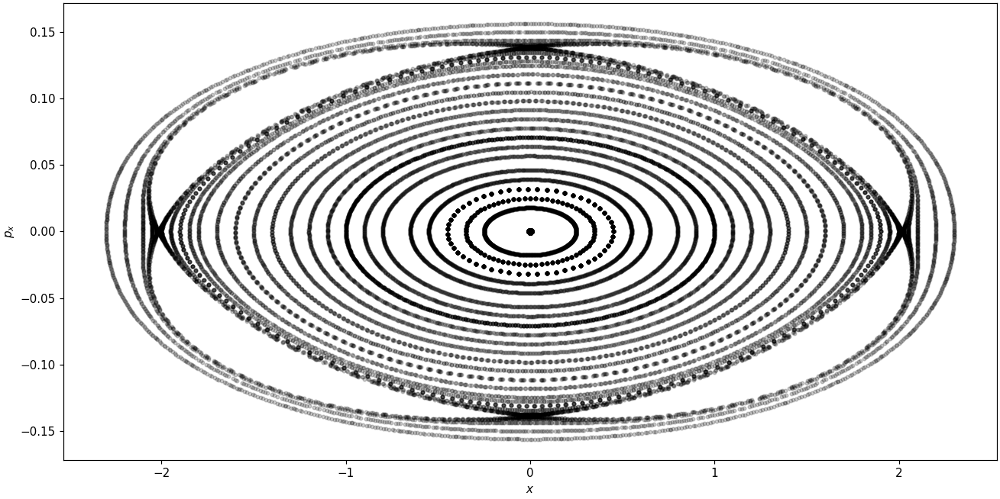

<IPython.core.display.Javascript object>


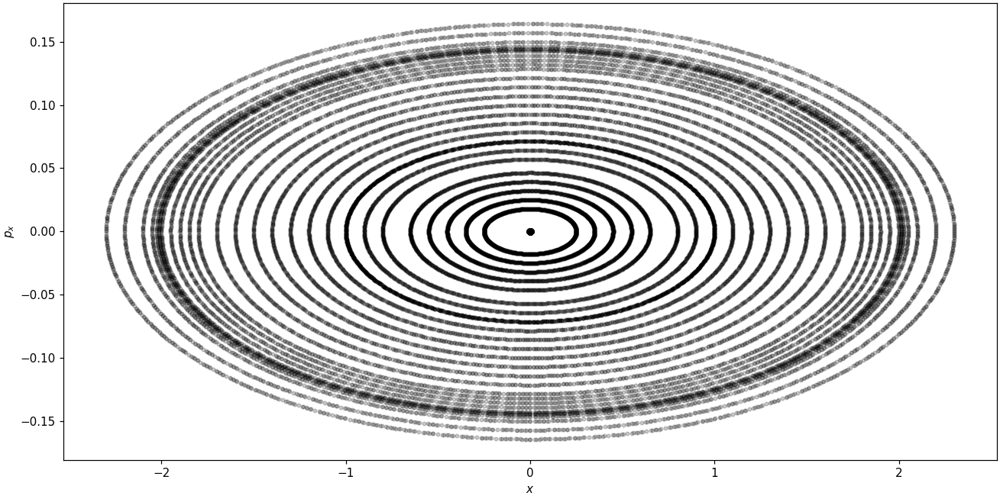

<IPython.core.display.Javascript object>


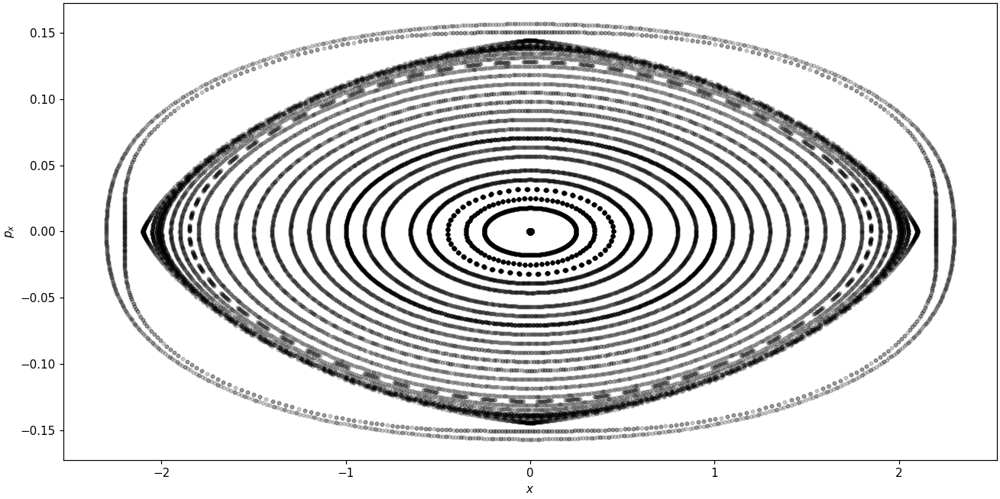

<IPython.core.display.Javascript object>


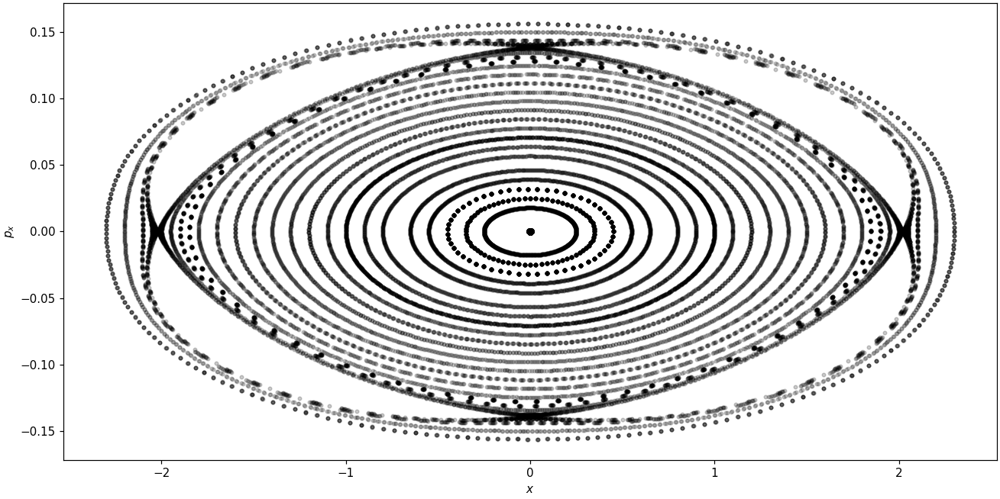

<IPython.core.display.Javascript object>


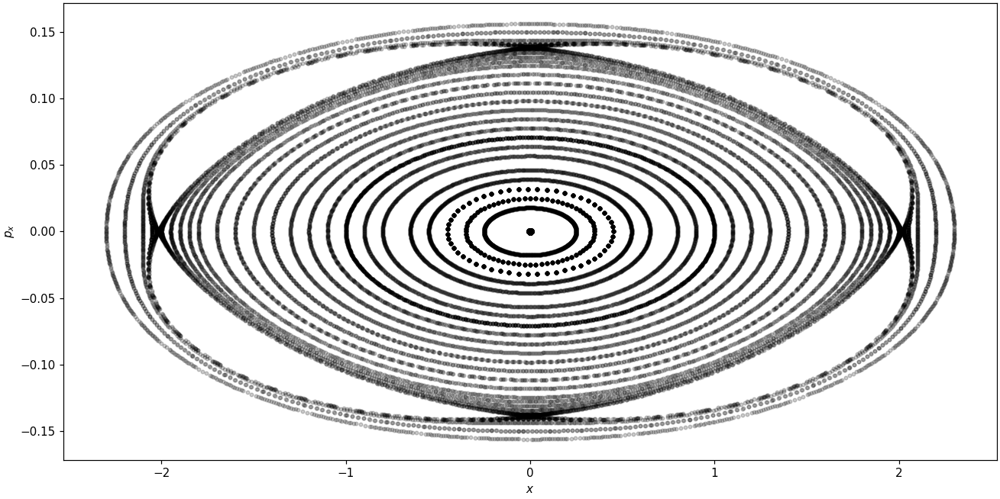

In [17]:
X_Exact_array = np.array(X_Exact)
X_lin_array = np.array(X_lin)
X_Exact_2_array = np.array(X_Exact_2)
X_Exact_4_array = np.array(X_Exact_4)
X_Exact_6_array = np.array(X_Exact_6)
X_Exact_8_array = np.array(X_Exact_8)


New_FIG(X_Exact_array[:,:,0],X_Exact_array[:,:,1],X_Exact_array[:,:,2],X_Exact_array[:,:,3])
# New_FIG(X_lin_array[:,:,0],X_lin_array[:,:,1],X_lin_array[:,:,2],X_lin_array[:,:,3])
New_FIG(X_Exact_2_array[:,:,0],X_Exact_2_array[:,:,1],X_Exact_2_array[:,:,2],X_Exact_2_array[:,:,3])
New_FIG(X_Exact_4_array[:,:,0],X_Exact_4_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_4_array[:,:,3])
New_FIG(X_Exact_6_array[:,:,0],X_Exact_6_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_6_array[:,:,3])
New_FIG(X_Exact_8_array[:,:,0],X_Exact_8_array[:,:,1],X_Exact_6_array[:,:,2],X_Exact_8_array[:,:,3])

# plt.savefig('Drift_Exact.png')
plt.show()

### px intit = 0.05

In [18]:
_ld1 = float(LD.subs(rept))
_ld2 = float(LD.subs(rept))
_lqf = float(LQF.subs(rept))
_lqd = float(LQD.subs(rept))
_k1  = float(KQF.subs(rept))
_k2  = float(KQD.subs(rept))
dev  = 0
 
eps = 0.0
duration = 1000 #number of turns

dpx = 0.05

R0 = GenerateNDimCoordinateGrid(6,2,man_ranges={
    0:[1.0000e-06, 1.0000e-04, 1.0000e-02, 1.0000e+00, 2.5000e-01,
       3.5000e-01, 4.5000e-01, 5.5000e-01, 6.5000e-01, 8.0000e-01,
       9.0000e-01, 1.0000e+00, 1.1000e+00, 1.2000e+00, 1.3000e+00,
       1.4000e+00, 1.5000e+00, 1.6000e+00, 1.7000e+00, 1.8000e+00,
       1.8500e+00, 1.9000e+00, 1.9500e+00, 2.0000e+00, 2.0125e+00,
       2.0250e+00, 2.0500e+00, 2.1000e+00, 2.2000e+00, 2.3000e+00],
    1:[0,dpx],
    2:[0],
    3:[0],
    4:[0],
    5:[0]
})
r0 = R0.T.reshape(int(R0.size/6),6)

X_Exact = np.array([r0])
X_lin = np.array([r0])
X_Exact_2 = np.array([r0])
X_Exact_4 = np.array([r0])
X_Exact_6 = np.array([r0])
X_Exact_8 = np.array([r0])

for i in tqdm(range(1, duration + 1)): 
    r_exact = FODO_Exact(X_Exact[-1])
    r_lin = FODO_lin(X_lin[-1])
    r_2 = FODO(X_Exact_2[-1],f_x_2,f_y_2)
    r_4 = FODO(X_Exact_4[-1],f_x_4,f_y_4)
    r_6 = FODO(X_Exact_6[-1],f_x_6,f_y_6)
    r_8 = FODO(X_Exact_8[-1],f_x_8,f_y_8)
    

    X_Exact = np.append(X_Exact, [r_exact], axis = 0)
    X_lin = np.append(X_lin, [r_lin], axis = 0)
    X_Exact_2 = np.append(X_Exact_2, [r_2], axis = 0)
    X_Exact_4 = np.append(X_Exact_4, [r_4], axis = 0)
    X_Exact_6 = np.append(X_Exact_6, [r_6], axis = 0)
    X_Exact_8 = np.append(X_Exact_8, [r_8], axis = 0)

Shape: (6, 2, 30, 1, 1, 1, 1) - Number of paritcles: 60 


100%|██████████| 1000/1000 [00:05<00:00, 198.78it/s]


<IPython.core.display.Javascript object>


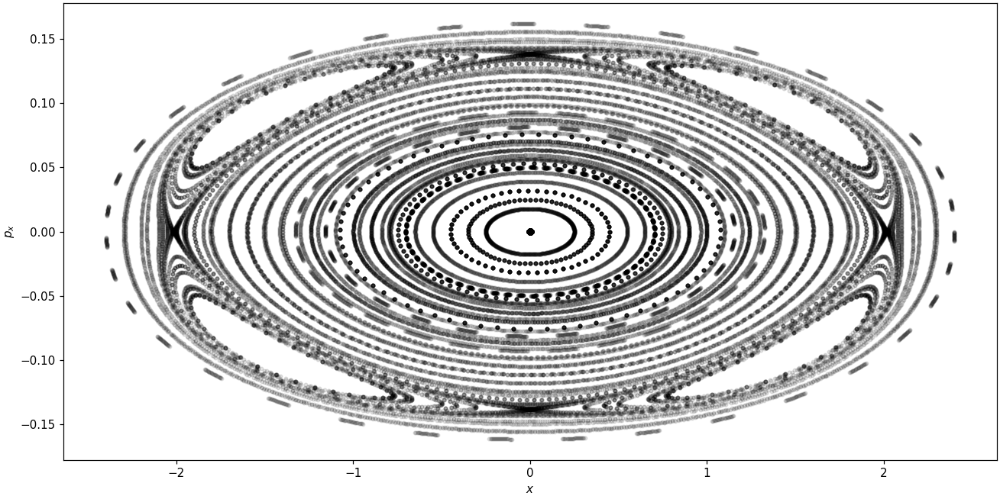

<IPython.core.display.Javascript object>


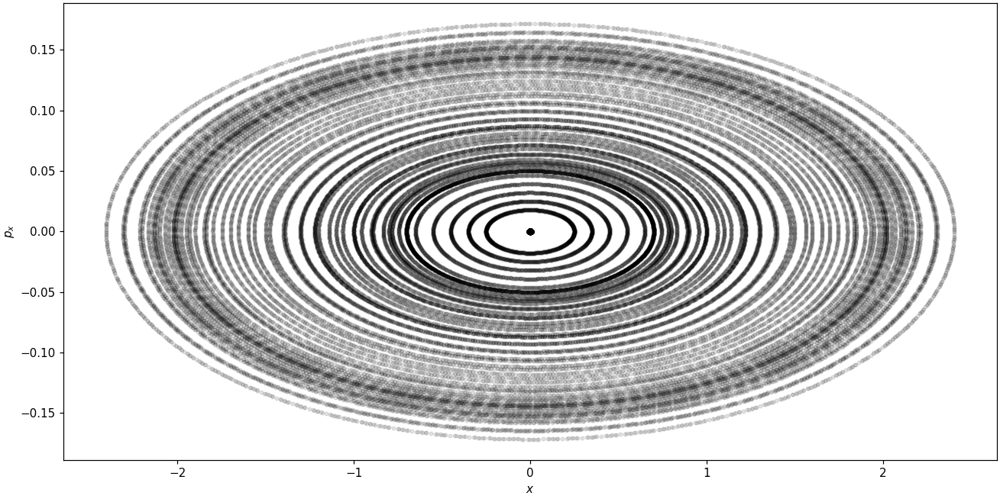

<IPython.core.display.Javascript object>


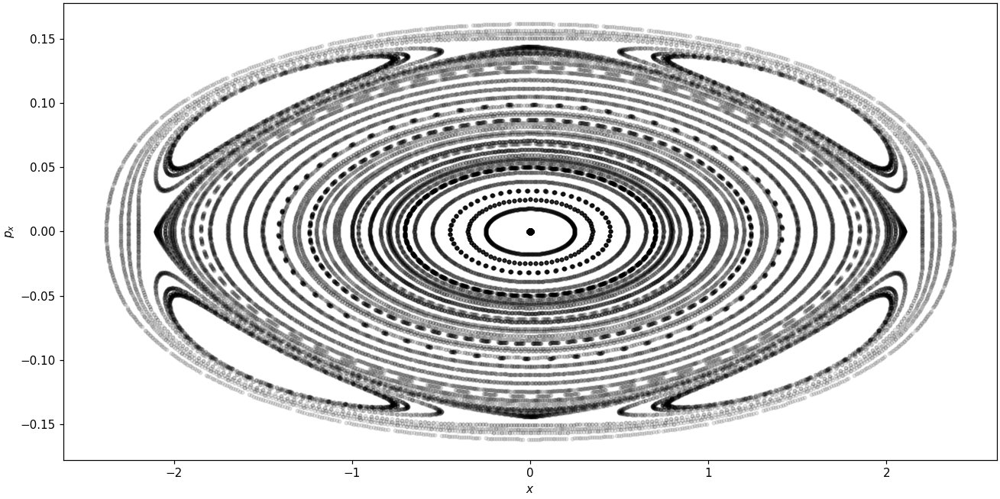

<IPython.core.display.Javascript object>


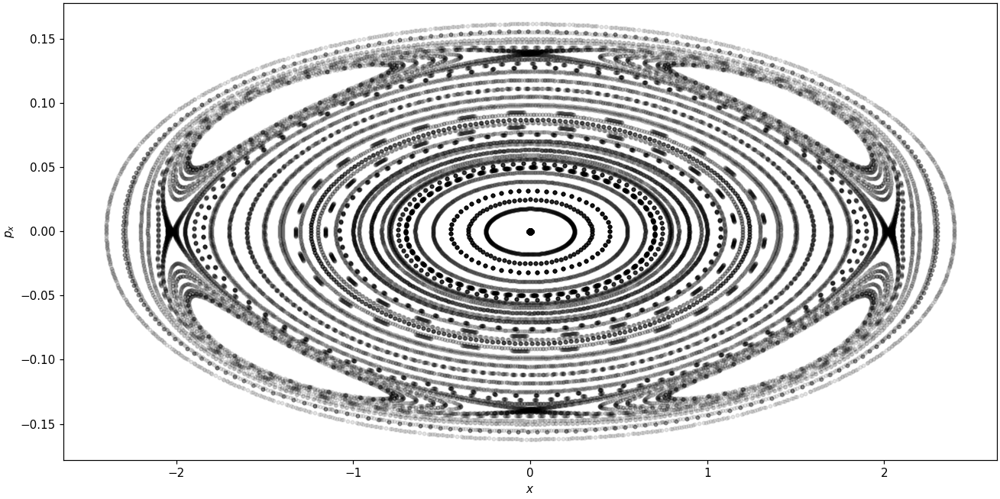

<IPython.core.display.Javascript object>


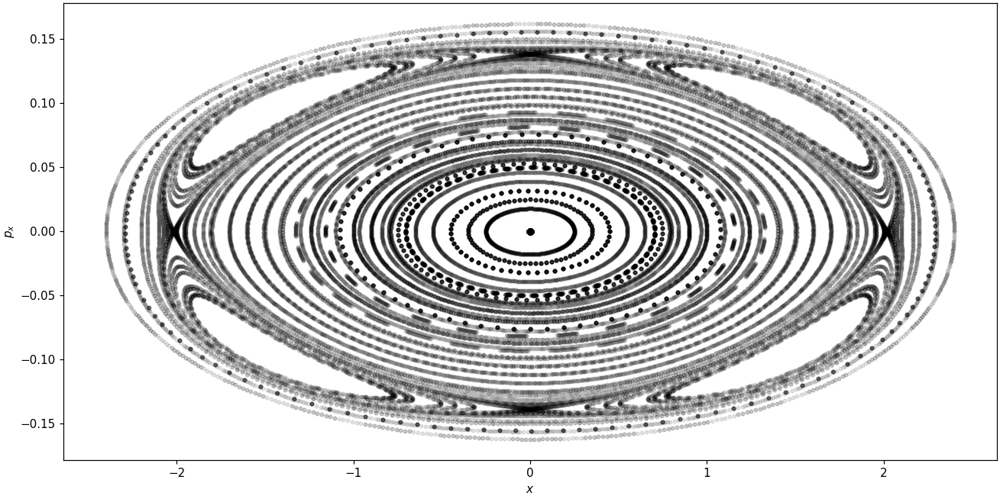

In [22]:
X_Exact_array = np.array(X_Exact)
X_lin_array = np.array(X_lin)
X_Exact_2_array = np.array(X_Exact_2)
X_Exact_4_array = np.array(X_Exact_4)
X_Exact_6_array = np.array(X_Exact_6)
X_Exact_8_array = np.array(X_Exact_8)

New_FIG(X_Exact_array[:,:,0],X_Exact_array[:,:,1],X_Exact_array[:,:,2],X_Exact_array[:,:,3])
# New_FIG(X_lin_array[:,:,0],X_lin_array[:,:,1],X_lin_array[:,:,2],X_lin_array[:,:,3])
New_FIG(X_Exact_2_array[:,:,0],X_Exact_2_array[:,:,1],X_Exact_2_array[:,:,2],X_Exact_2_array[:,:,3])
New_FIG(X_Exact_4_array[:,:,0],X_Exact_4_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_4_array[:,:,3])
New_FIG(X_Exact_6_array[:,:,0],X_Exact_6_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_6_array[:,:,3])
New_FIG(X_Exact_8_array[:,:,0],X_Exact_8_array[:,:,1],X_Exact_6_array[:,:,2],X_Exact_8_array[:,:,3])


# plt.savefig('Drift_Exact.png')
plt.show()

## Using Tom's drift expansion

In [19]:
# re-evaluate symbols on top not sure why yet
f_x_2,f_y_2,f_x_4,f_y_4,f_x_6,f_y_6,f_x_8,f_y_8 = generate_drift_maps(switch=1, rep=rept)

100%|██████████| 2/2 [00:00<00:00, 424.98it/s]


### px init = 0 

In [20]:
_ld1 = float(LD.subs(rept))
_ld2 = float(LD.subs(rept))
_lqf = float(LQF.subs(rept))
_lqd = float(LQD.subs(rept))
_k1  = float(KQF.subs(rept))
_k2  = float(KQD.subs(rept))
dev  = 0
 
dpx = 0.0

R0 = GenerateNDimCoordinateGrid(6,2,man_ranges={
    0:[1.0000e-06, 1.0000e-04, 1.0000e-02, 1.0000e+00, 2.5000e-01,
       3.5000e-01, 4.5000e-01, 5.5000e-01, 6.5000e-01, 8.0000e-01,
       9.0000e-01, 1.0000e+00, 1.1000e+00, 1.2000e+00, 1.3000e+00,
       1.4000e+00, 1.5000e+00, 1.6000e+00, 1.7000e+00, 1.8000e+00,
       1.8500e+00, 1.9000e+00, 1.9500e+00, 2.0000e+00, 2.0125e+00,
       2.0250e+00, 2.0500e+00, 2.1000e+00, 2.2000e+00, 2.3000e+00],
    1:[0,dpx],
    2:[0],
    3:[0],
    4:[0],
    5:[0]
})

r0 = R0.T.reshape(int(R0.size/6),6)

X_Exact = np.array([r0])
X_lin = np.array([r0])
X_Exact_2 = np.array([r0])
X_Exact_4 = np.array([r0])
X_Exact_6 = np.array([r0])
X_Exact_8 = np.array([r0])


for i in tqdm(range(1, duration + 1)): 
    
    r_exact = FODO_Exact(X_Exact[-1])
    r_lin = FODO_lin(X_lin[-1])
    
    r_2 = FODO(X_Exact_2[-1],f_x_2,f_y_2)
    r_4 = FODO(X_Exact_4[-1],f_x_4,f_y_4)
    r_6 = FODO(X_Exact_6[-1],f_x_6,f_y_6)
    r_8 = FODO(X_Exact_8[-1],f_x_8,f_y_8)


    X_Exact = np.append(X_Exact, [r_exact], axis = 0)
    X_lin = np.append(X_lin, [r_lin], axis = 0)
    X_Exact_2 = np.append(X_Exact_2, [r_2], axis = 0)
    X_Exact_4 = np.append(X_Exact_4, [r_4], axis = 0)
    X_Exact_6 = np.append(X_Exact_6, [r_6], axis = 0)
    X_Exact_8 = np.append(X_Exact_8, [r_8], axis = 0)

Shape: (6, 2, 30, 1, 1, 1, 1) - Number of paritcles: 60 


100%|██████████| 1000/1000 [00:02<00:00, 354.97it/s]


<IPython.core.display.Javascript object>


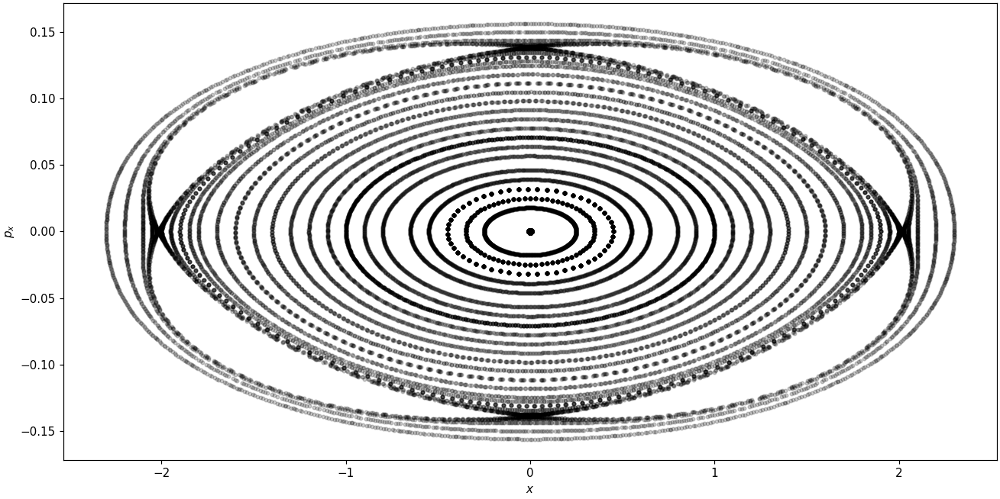

<IPython.core.display.Javascript object>


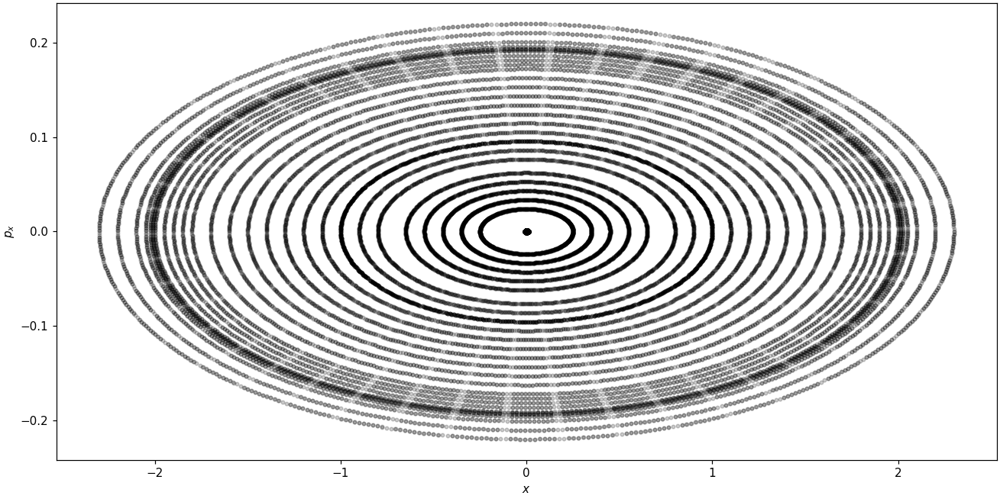

<IPython.core.display.Javascript object>


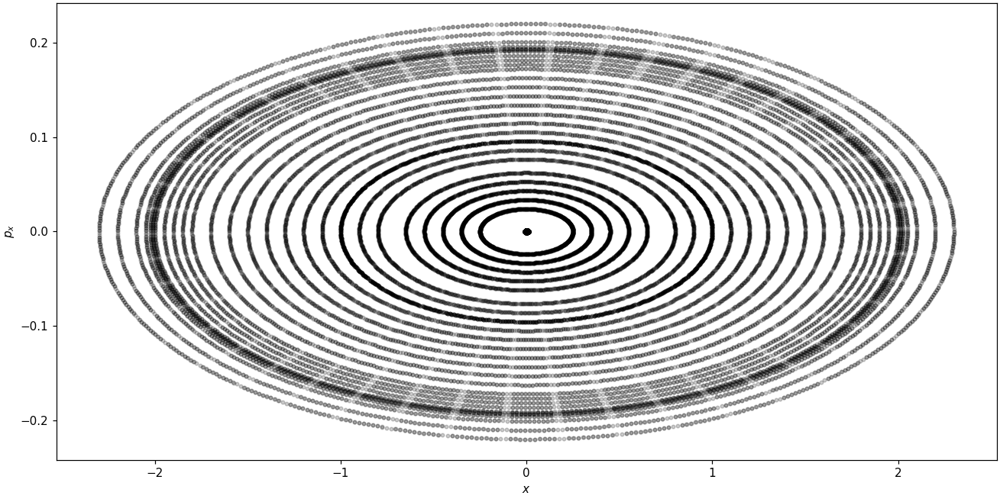

<IPython.core.display.Javascript object>


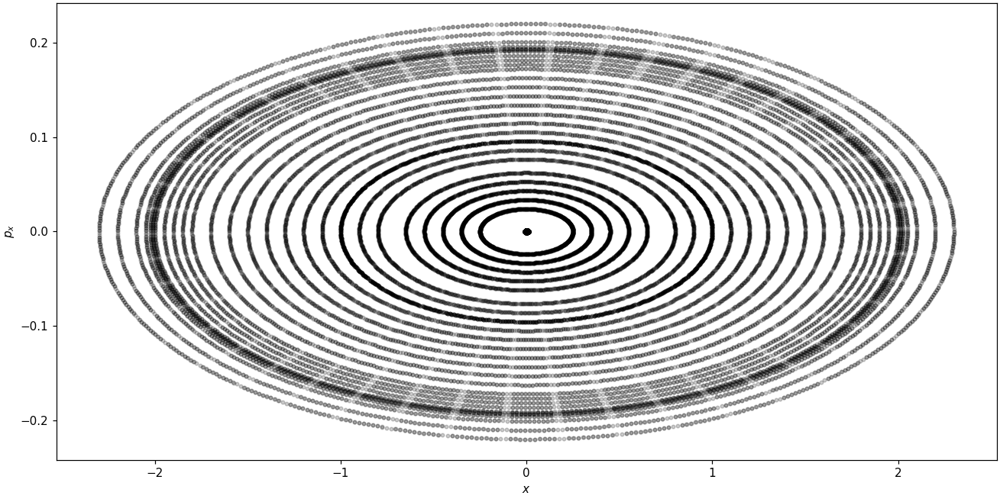

<IPython.core.display.Javascript object>


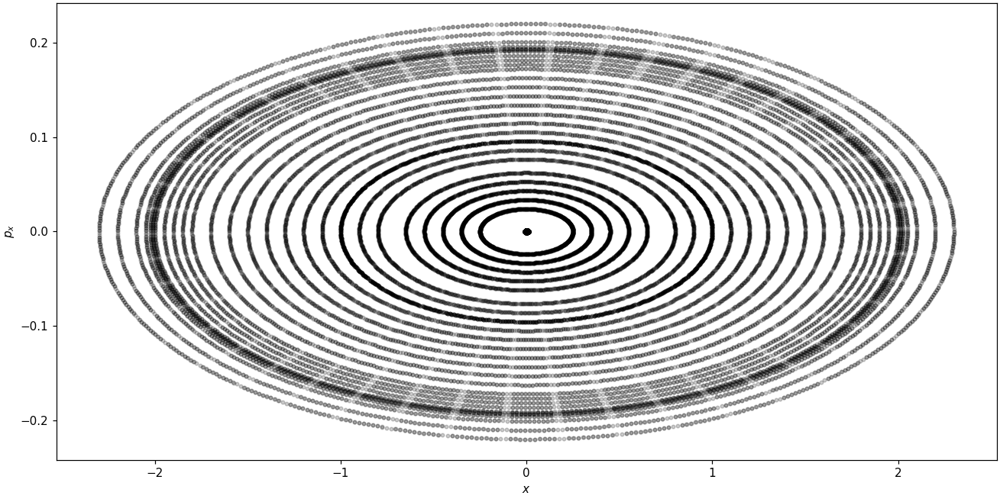

In [25]:
X_Exact_array = np.array(X_Exact)
X_lin_array = np.array(X_lin)
X_Exact_2_array = np.array(X_Exact_2)
X_Exact_4_array = np.array(X_Exact_4)
X_Exact_6_array = np.array(X_Exact_6)
X_Exact_8_array = np.array(X_Exact_8)

New_FIG(X_Exact_array[:,:,0],X_Exact_array[:,:,1],X_Exact_array[:,:,2],X_Exact_array[:,:,3])
# New_FIG(X_lin_array[:,:,0],X_lin_array[:,:,1],X_lin_array[:,:,2],X_lin_array[:,:,3])
New_FIG(X_Exact_2_array[:,:,0],X_Exact_2_array[:,:,1],X_Exact_2_array[:,:,2],X_Exact_2_array[:,:,3])
New_FIG(X_Exact_4_array[:,:,0],X_Exact_4_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_4_array[:,:,3])
New_FIG(X_Exact_6_array[:,:,0],X_Exact_6_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_6_array[:,:,3])
New_FIG(X_Exact_8_array[:,:,0],X_Exact_8_array[:,:,1],X_Exact_6_array[:,:,2],X_Exact_8_array[:,:,3])


# plt.savefig('Drift_Exact.png')
plt.show()

### px intit = 0.05

In [21]:
_ld1 = float(LD.subs(rept))
_ld2 = float(LD.subs(rept))
_lqf = float(LQF.subs(rept))
_lqd = float(LQD.subs(rept))
_k1  = float(KQF.subs(rept))
_k2  = float(KQD.subs(rept))
dev  = 0
 
dpx = 0.05

R0 = GenerateNDimCoordinateGrid(6,2,man_ranges={
    0:[1.0000e-06, 1.0000e-04, 1.0000e-02, 1.0000e+00, 2.5000e-01,
       3.5000e-01, 4.5000e-01, 5.5000e-01, 6.5000e-01, 8.0000e-01,
       9.0000e-01, 1.0000e+00, 1.1000e+00, 1.2000e+00, 1.3000e+00,
       1.4000e+00, 1.5000e+00, 1.6000e+00, 1.7000e+00, 1.8000e+00,
       1.8500e+00, 1.9000e+00, 1.9500e+00, 2.0000e+00, 2.0125e+00,
       2.0250e+00, 2.0500e+00, 2.1000e+00, 2.2000e+00, 2.3000e+00],
    1:[0,dpx],
    2:[0],
    3:[0],
    4:[0],
    5:[0]
})
r0 = R0.T.reshape(int(R0.size/6),6)

X_Exact = np.array([r0])
X_lin = np.array([r0])
X_Exact_2 = np.array([r0])
X_Exact_4 = np.array([r0])
X_Exact_6 = np.array([r0])
X_Exact_8 = np.array([r0])


for i in tqdm(range(1, duration + 1)): 
    
    r_exact = FODO_Exact(X_Exact[-1])
    r_lin = FODO_lin(X_lin[-1])
    r_2 = FODO(X_Exact_2[-1],f_x_2,f_y_2)
    r_4 = FODO(X_Exact_4[-1],f_x_4,f_y_4)
    r_6 = FODO(X_Exact_6[-1],f_x_6,f_y_6)
    r_8 = FODO(X_Exact_8[-1],f_x_8,f_y_8)


    X_Exact = np.append(X_Exact, [r_exact], axis = 0)
    X_lin = np.append(X_lin, [r_lin], axis = 0)
    X_Exact_2 = np.append(X_Exact_2, [r_2], axis = 0)
    X_Exact_4 = np.append(X_Exact_4, [r_4], axis = 0)
    X_Exact_6 = np.append(X_Exact_6, [r_6], axis = 0)
    X_Exact_8 = np.append(X_Exact_8, [r_8], axis = 0)

Shape: (6, 2, 30, 1, 1, 1, 1) - Number of paritcles: 60 


100%|██████████| 1000/1000 [00:03<00:00, 326.84it/s]


<IPython.core.display.Javascript object>


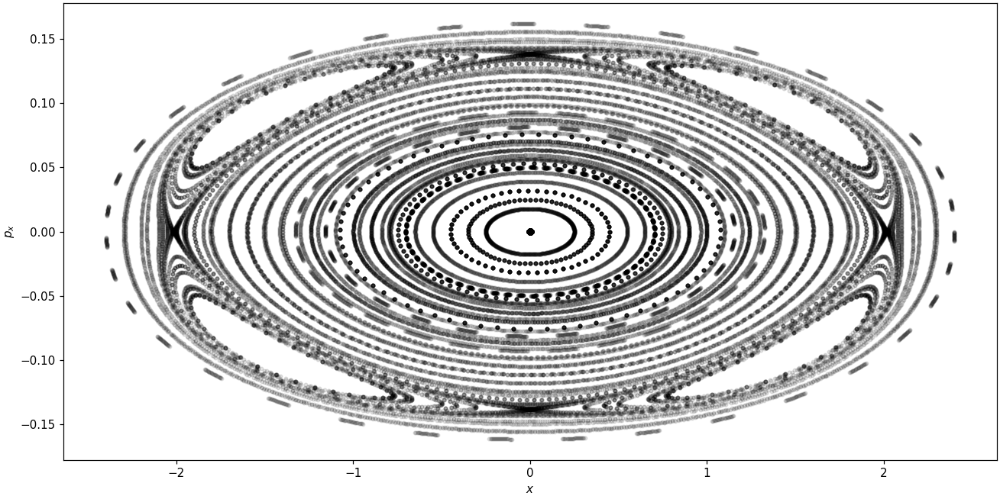

<IPython.core.display.Javascript object>


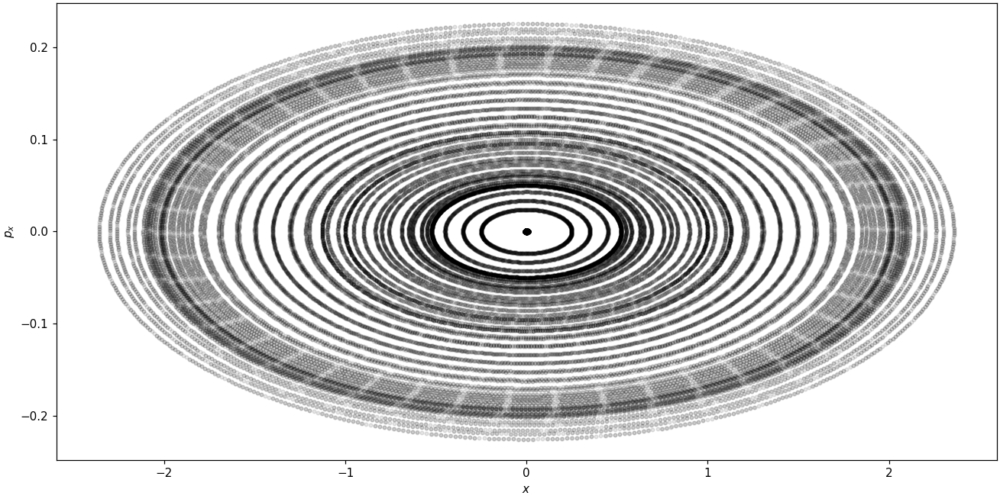

<IPython.core.display.Javascript object>


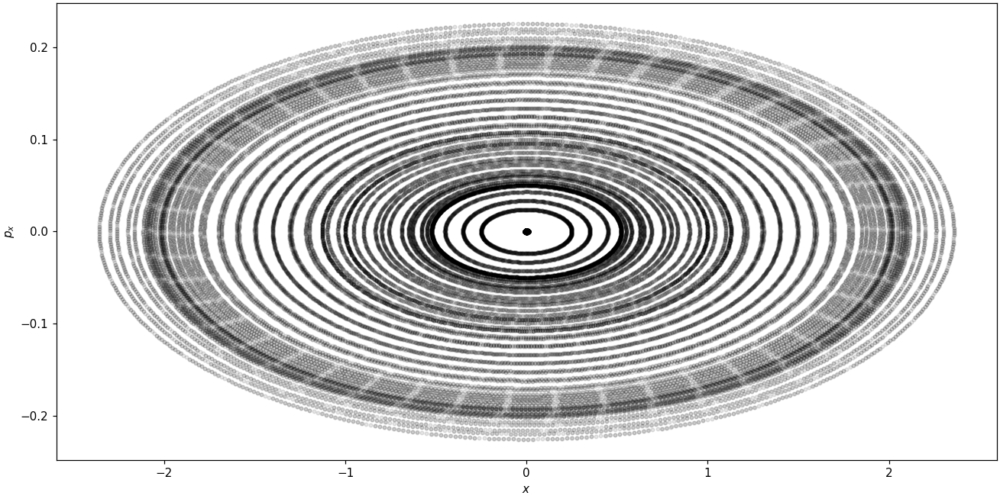

<IPython.core.display.Javascript object>


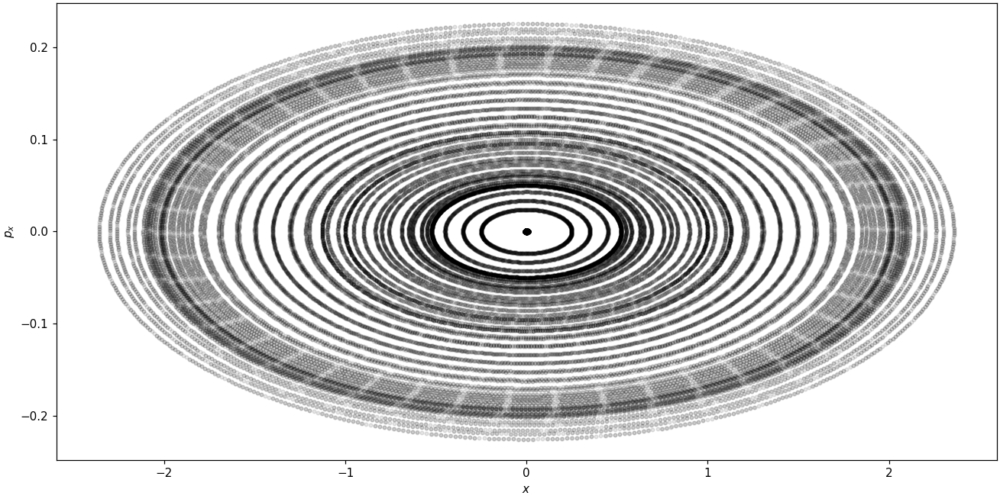

<IPython.core.display.Javascript object>


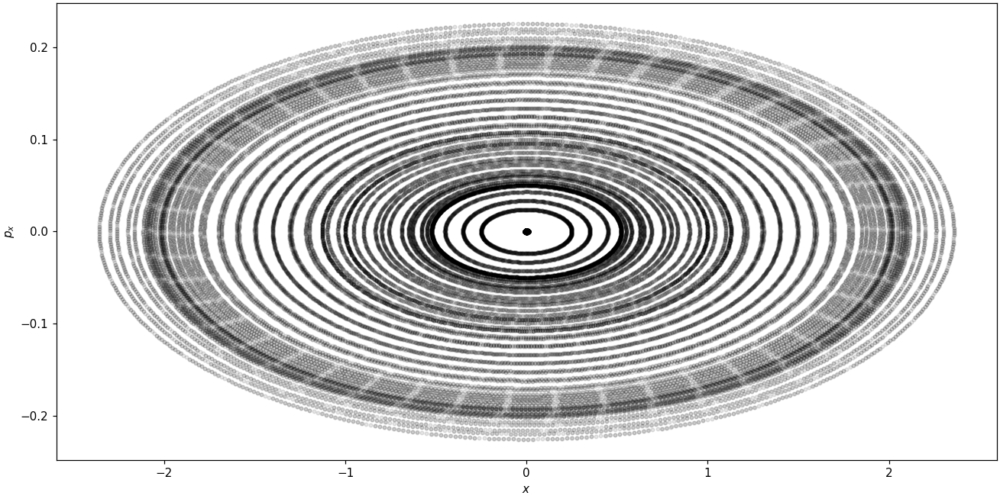

In [27]:
X_Exact_array = np.array(X_Exact)
X_lin_array = np.array(X_lin)
X_Exact_2_array = np.array(X_Exact_2)
X_Exact_4_array = np.array(X_Exact_4)
X_Exact_6_array = np.array(X_Exact_6)
X_Exact_8_array = np.array(X_Exact_8)

New_FIG(X_Exact_array[:,:,0],X_Exact_array[:,:,1],X_Exact_array[:,:,2],X_Exact_array[:,:,3])
# New_FIG(X_lin_array[:,:,0],X_lin_array[:,:,1],X_lin_array[:,:,2],X_lin_array[:,:,3])
New_FIG(X_Exact_2_array[:,:,0],X_Exact_2_array[:,:,1],X_Exact_2_array[:,:,2],X_Exact_2_array[:,:,3])
New_FIG(X_Exact_4_array[:,:,0],X_Exact_4_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_4_array[:,:,3])
New_FIG(X_Exact_6_array[:,:,0],X_Exact_6_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_6_array[:,:,3])
New_FIG(X_Exact_8_array[:,:,0],X_Exact_8_array[:,:,1],X_Exact_6_array[:,:,2],X_Exact_8_array[:,:,3])


# plt.savefig('Drift_Exact.png')
plt.show()

# Build Effective Hamiltonian

## Replace middle part by effective Hamiltonian (D-QD-D) and keep exact quad maps for QF

In [27]:
eldict = {
    'drift' : 1,
    'quad'  : 2,
    'squad' : 25,
    'sext'  : 3
}

beamlines = [
    [eldict['quad'] , 4, LQF, KQF, 0],
    [eldict['drift'], 6, LD , Zero(), 0   ],
    [eldict['quad'] , 4, LQD, KQD, 0],
    [eldict['drift'], 6, LD + dld,   Zero(), 0   ],
    [eldict['quad'] , 4, LQF, KQF, 0],
]

In [29]:
EHD2 = AssignHam(*[eldict['drift'], 2, LD , Zero(), 0   ])
EHD4 = AssignHam(*[eldict['drift'], 4, LD , Zero(), 0   ])
EHD6 = AssignHam(*[eldict['drift'], 6, LD , Zero(), 0   ])
EHD8 = AssignHam(*[eldict['drift'], 8, LD , Zero(), 0   ])

qorder = 6
EHQF2 = AssignHam(*[eldict['quad'] , qorder, LQF, KQF, 0])
EHQF4 = AssignHam(*[eldict['quad'] , qorder, LQF, KQF, 0])
EHQF6 = AssignHam(*[eldict['quad'] , qorder, LQF, KQF, 0])
EHQF8 = AssignHam(*[eldict['quad'] , qorder, LQF, KQF, 0])

EHQD2 = AssignHam(*[eldict['quad'], qorder, LQD, KQD, 0])
EHQD4 = AssignHam(*[eldict['quad'], qorder, LQD, KQD, 0])
EHQD6 = AssignHam(*[eldict['quad'], qorder, LQD, KQD, 0])
EHQD8 = AssignHam(*[eldict['quad'], qorder, LQD, KQD, 0])

In [30]:
def effhamtrack(r, fx,fpx,fy,fpy):
    _x = r[:,0]
    _px = r[:,1]
    _y = r[:,2]
    _py = r[:,3]
    _z = r[:,4]
    _pz = r[:,5]
    
    xn  = fx( _x,_px,_y,_py,_pz)
    pxn = fpx(_x,_px,_y,_py,_pz)
    yn  = fy( _x,_px,_y,_py,_pz)
    pyn = fpy(_x,_px,_y,_py,_pz)
    zn  = _z
    pzn = _pz
    
    return np.array([xn, pxn, yn, pyn, zn, pzn]).transpose()

def track(_x0, fx, fpx, fy, fpy):
    r = quadf_exact(_x0,_lqf,_k1)
    r = effhamtrack(r, fx, fpx, fy, fpy)
    r = quadf_exact(r,_lqf,_k1)
    return r

def track01(_x0, fx2, fpx2, fy2, fpy2, fx, fy):
    r = effhamtrack(_x0, fx2, fpx2, fy2, fpy2)
    r = quadff_exact(r,_lqd,_k2)
#     r = drift_exact(r,_lds1)
#     r = sext_exact(r,_lsext,_k3)
#     r = drift_exact(r,_lds2)
#     r = quadff_exact(r,_lqd,_k2)
    r = driftmap(r,_ld2,fx,fy)
    r = quadf_exact(r,_lqf,_k1)
    return r

In [175]:
x, px, y, py, z, delta, eps, h , k0, k1, k2, sigma, betag ,f = symbols('x p_x y p_y z delta epsilon h k_0 k_1 k_2 sigma beta_gamma f', real=True)
L, beta0, gamma0 = symbols(" L beta_0 gamma_0", real=True, positive=True)

# standardized substitutions that are useful - ORDER IN LISTS COUNTS !!!!
betagamma_rep = list(zip([beta0*gamma0,beta0],[oo,1]))
series_rep = list(zip([px,py,delta],[eps*px,eps*py,eps*delta]))
coord_rep = list(zip([x,y],[eps*x,eps*y]))
thin_rep = list(zip([px,py,delta],[0,0,0]))
xpx_rep = list(zip([y,py,delta],[0,0,0]))

sym_k, sym_l, sym_d, sym_beta = symbols('k_{Q} L D beta')
J = np.array([[0,1,0,0],
              [-1,0,0,0],
              [0,0,0,1],
              [0,0,-1,0]])

i_coord = [x,y]
i_mom = [px,py]
tot_coords = [x,px,y,py]

In [180]:
# EHQF2-EHD2
bchorder = 4
torder   = 4

H2 = LieOperator(EHQF2.subs(rept),[x,y,z],[px,py,delta]).doit()

H2 = H2.BCH(LieOperator(EHD2.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H2 = truncate(H2,torder)
H2 = LieOperator(H2,[x,y,z],[px,py,delta]).doit()

# Taylor
# H2T = taylorize(H2,20)

# # maps
# ef_x_2  = lambdify( (x,px,y,py,delta), H2T[0] )
# ef_px_2 = lambdify( (x,px,y,py,delta), H2T[1] )
# ef_y_2  = lambdify( (x,px,y,py,delta), H2T[2] )
# ef_py_2 = lambdify( (x,px,y,py,delta), H2T[3] )

In [32]:
eps_rep = list(zip([x,y,z,px,py,delta],[eps*x,eps*y,0,px*eps,py*eps,0]))
xyplane_rep = list(zip([y,py,z,delta],[0,0,0,0]))

In [66]:
n,m = symbols('n m')

lo = LieOperator(x**n*px**m,[x],[px])

lo.ExpPowerLieBracket(x,1).ham.doit().simplify(),lo.ExpPowerLieBracket(x,2).ham.doit().simplify(),lo.ExpPowerLieBracket(x,3).ham.doit().simplify(),lo.ExpPowerLieBracket(x,4).ham.doit().simplify()

In [67]:
n,m = symbols('n m')

lo = LieOperator(x**n*px**m,[x],[px])

lo.ExpPowerLieBracket(px,1).ham.doit().simplify(),lo.ExpPowerLieBracket(px,2).ham.doit().simplify(),lo.ExpPowerLieBracket(px,3).ham.doit().simplify(),lo.ExpPowerLieBracket(px,4).ham.doit().simplify()

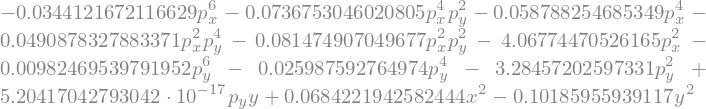

In [269]:
H2.ham

In [268]:
Poly(H2.ham).degree(x)

In [387]:
deg = 3
n = 1
m = 2
for d in range(1,deg+1):
    print(d*(m-1)+(d*n-(d-1)))

2
3
4


In [460]:
deg = 3

for m in range(1, 3*deg+1):
    for n in range(1, 3*deg+1):
        if (d*(m-1)+(d*n-(d-1)) <= deg ):
#                     print(x**n*px**m)
            expr(x**n*px**m)


set(expr)

In [68]:
def generate_pols(deg, r=False):
    expr = {k:[] for k in range(1,deg+1)}
    for m in range(0, 2*deg+1):
        for n in range(0, 2*deg+1):
            for d in range(1, deg+1):
                if r:
                    if (d*(n-1)+(d*m-(d-1)) <= deg ):
                        expr[d].append(x**m*px**n)
                else:
                    if (d*(m-1)+(d*n-(d-1)) <= deg ):
                        expr[d].append(x**n*px**m)
                
                
    return {k:set(v) for k,v in expr.items()}

In [69]:
generate_pols(3)

In [70]:
generate_pols(3,r=True)

In [195]:
def getmapsxpx(ham, deg):
    def generate_pols(deg, r=False):
        expr = {k:[] for k in range(1,deg+1)}
        for m in range(0, 2*deg+1):
            for n in range(0, 2*deg+1):
                for d in range(1, deg+1):
                    if r:
                        if (d*(n-1)+(d*m-(d-1)) <= deg ):
                            expr[d].append(x**m*px**n)
                    else:
                        if (d*(m-1)+(d*n-(d-1)) <= deg ):
                            expr[d].append(x**n*px**m)


        return {k:set(v) for k,v in expr.items()}
    
    dcx = generate_pols(deg)
    dcp = generate_pols(deg,r=True)
#     tic = time.perf_counter()
    newham = ham.subs(xyplane_rep)
    newhamsx  = [sum([newham.coeff(v) *v  for v in dcx[i]]).expand() for i in range(1,deg+1)]
    newhamspx = [sum([newham.coeff(v) *v  for v in dcp[i]]).expand() for i in range(1,deg+1)]
    newopesx  = [LieOperator(newham, [x],[px]) for newham in newhamsx]
    newopespx = [LieOperator(newham, [x],[px]) for newham in newhamspx]
    
   
    
    @ray.remote
    def lfx(i): 
#         newope2 = LieOperator(sum([newham.coeff(v) *v  for v in dc[i]]).expand(),[x],[px])
        return (Rational(1,factorial(i)) * newopesx[i].ExpPowerLieBracket(x,i).ham.doit())#.subs(eps_rep).expand() + O(eps**deg)).removeO().subs(eps,1)

    @ray.remote
    def lfpx(i):             
#         newope2 = LieOperator(sum([ham.coeff(v) *v  for v in dc(deg,r=True)[i]]).expand(),[x],[px])
        return (Rational(1,factorial(i)) * newopespx[i].ExpPowerLieBracket(px,i).ham.doit())#.subs(eps_rep).expand() + O(eps**deg)).removeO().subs(eps,1)
    # X
    futures = [lfx.remote(i) for i in range(deg)]
    res = ray.get(futures)
    s = sum(res).expand()
    
    # PX
    futuresp = [lfpx.remote(i) for i in range(deg)]
    resp = ray.get(futuresp)
    t = sum(resp).expand()
    
#     toc = time.perf_counter()
    
    return s,t

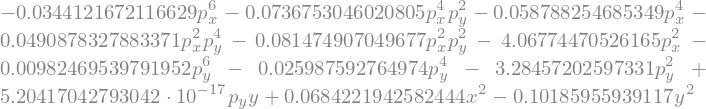

In [104]:
H2.ham

In [134]:
getmapsxpx(H2.ham, 6)

In [196]:
counter = []

for i in range(2,20):
    tic = time.perf_counter()
    maps = getmapsxpx(H2.ham, i)
    toc= time.perf_counter()
    print("Took {:.4f} seconds".format(toc-tic))
    counter.append(toc-tic)

Took 0.0505 seconds
Took 0.0514 seconds
Took 0.0539 seconds
Took 0.0687 seconds
Took 0.0556 seconds
Took 0.0708 seconds
Took 0.0753 seconds
Took 0.0850 seconds
Took 0.0880 seconds
Took 0.1056 seconds
Took 0.0970 seconds
Took 0.1275 seconds
Took 0.1433 seconds
Took 0.2003 seconds
Took 0.1488 seconds
Took 0.1607 seconds
Took 0.1897 seconds
Took 0.2333 seconds


In [197]:
maps

In [240]:
counter = []

for i in range(2,9):
    tic = time.perf_counter()
    maps = getmapsxpx(H2.ham, i)
    toc= time.perf_counter()
    print("Took {:.4f} seconds".format(toc-tic))
    counter.append(toc-tic)
    

Took 0.0701 seconds
Took 0.1971 seconds
Took 0.1850 seconds
Took 0.2878 seconds
Took 0.3912 seconds
Took 0.7570 seconds
Took 3.2914 seconds


In [148]:
# EHD2-EHQD2-EHD2
bchorder = 4
torder   = 12

H2 = LieOperator(EHD2.subs(rept),[x,y,z],[px,py,delta]).doit()

H2 = H2.BCH(LieOperator(EHQD2.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H2 = truncate(H2,torder)
H2 = LieOperator(H2,[x,y,z],[px,py,delta]).doit()

H2 = H2.BCH(LieOperator(EHD2.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H2 = truncate(H2,torder)
H2 = LieOperator(H2,[x,y,z],[px,py,delta]).doit()

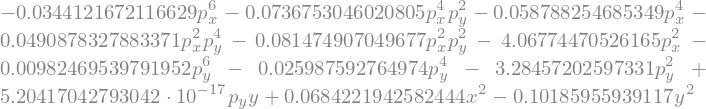

In [149]:
H2.ham

In [156]:
tic = time.perf_counter()
maps = getmapsxpx(H2.ham, 20)
toc= time.perf_counter()
print("Took {:.4f} seconds".format(toc-tic))

ef_x_2  = lambdify( (x,px,y,py,delta), maps[0] )
ef_px_2 = lambdify( (x,px,y,py,delta), maps[1] )
ef_y_2  = lambdify( (x,px,y,py,delta), y )
ef_py_2 = lambdify( (x,px,y,py,delta), py )

Took 0.4724 seconds


In [213]:
# EHD4-EHQD4-EHD4
bchorder = 4
torder   = 6

ypy_rep = list(zip([x,py],[0,0]))

H4 = LieOperator(EHD4.subs(rept),[x,y,z],[px,py,delta]).doit()

H4 = H4.BCH(LieOperator(EHQD4.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H4 = truncate(H4,torder)
H4 = LieOperator(H4,[x,y,z],[px,py,delta]).doit()

H4 = H4.BCH(LieOperator(EHD4.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H4 = truncate(H4,torder)
H4 = LieOperator(H4,[x,y,z],[px,py,delta]).doit()

In [214]:
tic = time.perf_counter()
maps = getmapsxpx(H4.ham, 6)
toc= time.perf_counter()
print("Took {:.4f} seconds".format(toc-tic))

# maps
ef_x_4  = lambdify( (x,px,y,py,delta), maps[0] )
ef_px_4 = lambdify( (x,px,y,py,delta), maps[1] )
ef_y_4  = lambdify( (x,px,y,py,delta), y)
ef_py_4 = lambdify( (x,px,y,py,delta), py )

Took 6.3993 seconds


In [215]:
_ld1 = float(LD.subs(rept))
_ld2 = float(LD.subs(rept))
_lqf = float(LQF.subs(rept))
_lqd = float(LQD.subs(rept))
_k1  = float(KQF.subs(rept))
_k2  = float(KQD.subs(rept))
dev  = 0
 
dpx = 0.05

R0 = GenerateNDimCoordinateGrid(6,2,man_ranges={
    0:[1.0000e-06, 1.0000e-04, 1.0000e-02, 1.0000e+00, 2.5000e-01,
       3.5000e-01, 4.5000e-01, 5.5000e-01, 6.5000e-01, 8.0000e-01,
       9.0000e-01, 1.0000e+00, 1.1000e+00, 1.2000e+00, 1.3000e+00,
       1.4000e+00, 1.5000e+00, 1.6000e+00, 1.7000e+00, 1.8000e+00,
       1.8500e+00, 1.9000e+00, 1.9500e+00, 2.0000e+00, 2.0125e+00,
       2.0250e+00, 2.0500e+00, 2.1000e+00, 2.2000e+00, 2.3000e+00
      ],
    1:[0,dpx],
    2:[0],
    3:[0],
    4:[0],
    5:[0]
})
r0 = R0.T.reshape(int(R0.size/6),6)

X_Exact = np.array([r0])
X_lin = np.array([r0])
X_Exact_2 = np.array([r0])
X_Exact_4 = np.array([r0])
# X_Exact_6 = np.array([r0])
# X_Exact_8 = np.array([r0])


for i in tqdm(range(1,1000+1)):
    r_exact = FODO_Exact(X_Exact[-1])
#     r_2 = track01(X_Exact_2[-1],ef_x_2,ef_px_2,ef_y_2,ef_py_2,f_x_2,f_y_2)
    r_2 = track(X_Exact_2[-1],ef_x_2,ef_px_2,ef_y_2,ef_py_2)
    r_4 = track(X_Exact_4[-1],ef_x_4,ef_px_4,ef_y_4,ef_py_4)
#     r_6 = FODO_6(X_Exact_6[-1])
#     r_8 = FODO_8(X_Exact_8[-1])


    X_Exact = np.append(X_Exact, [r_exact], axis = 0)
    X_Exact_2 = np.append(X_Exact_2, [r_2], axis = 0)
    X_Exact_4 = np.append(X_Exact_4, [r_4], axis = 0)
#     X_Exact_6 = np.append(X_Exact_6, [r_6], axis = 0)
#     X_Exact_8 = np.append(X_Exact_8, [r_8], axis = 0)

Shape: (6, 2, 30, 1, 1, 1, 1) - Number of paritcles: 60 


100%|██████████| 1000/1000 [00:02<00:00, 345.82it/s]


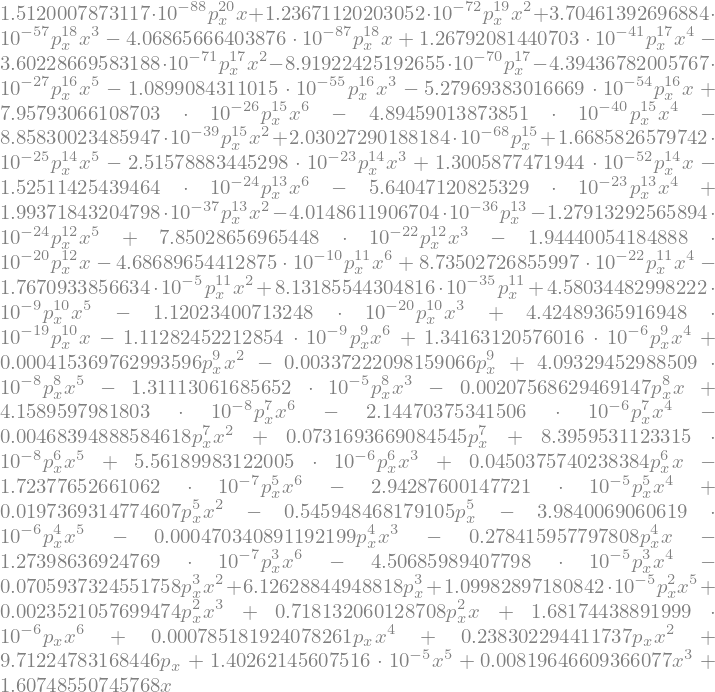

In [216]:
maps[0]

<IPython.core.display.Javascript object>


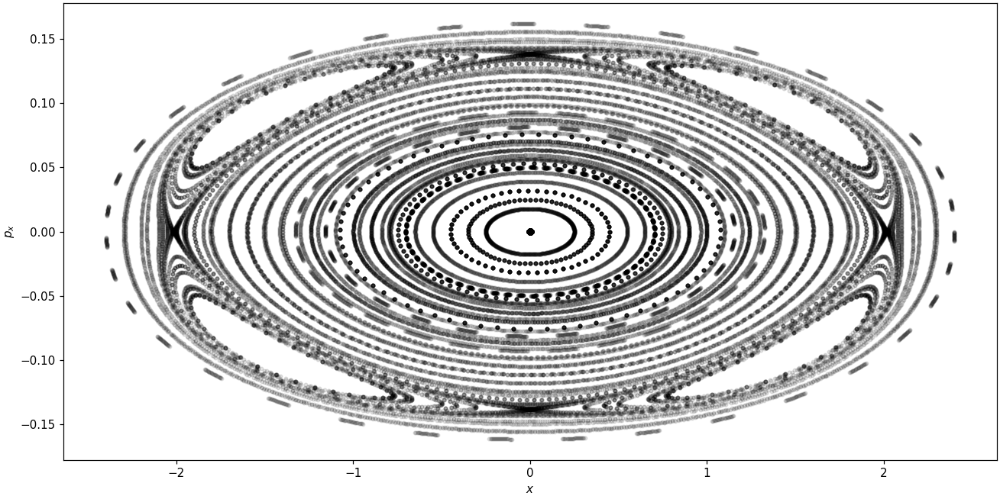

<IPython.core.display.Javascript object>


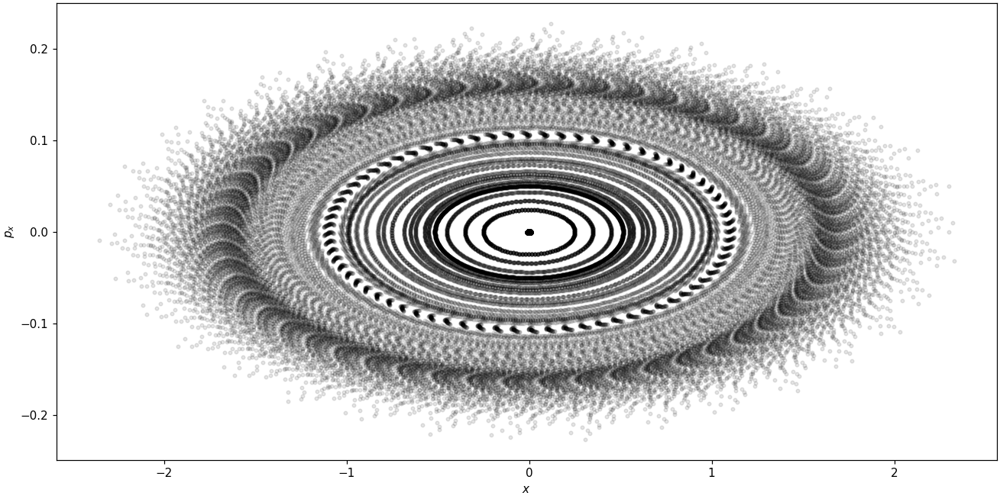

<IPython.core.display.Javascript object>


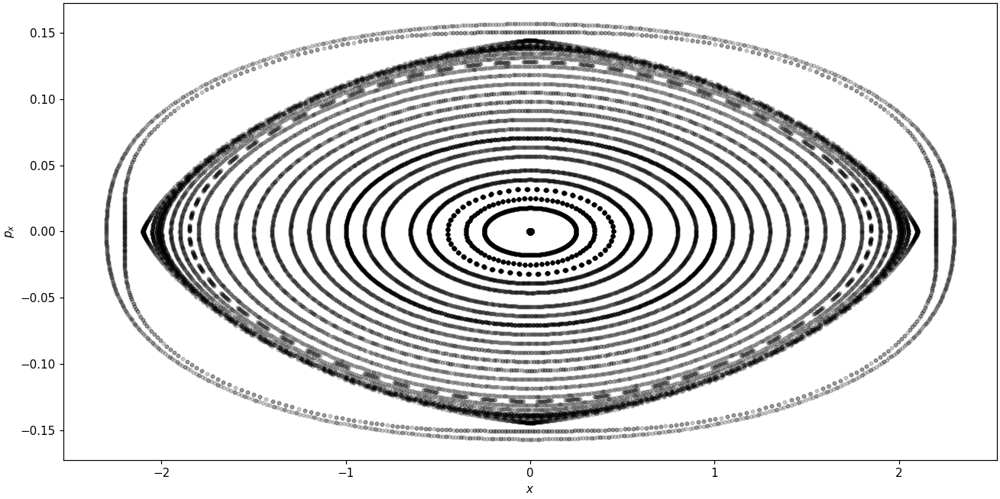

In [217]:
X_Exact_array = np.array(X_Exact)
# X_lin_array = np.array(X_lin)
X_Exact_2_array = np.array(X_Exact_2)
# X_Exact_4_array = np.array(X_Exact_4)
# X_Exact_6_array = np.array(X_Exact_6)
# X_Exact_8_array = np.array(X_Exact_8)

d2 = False
New_FIG(X_Exact_array[:,:,0],X_Exact_array[:,:,1],X_Exact_array[:,:,2],X_Exact_array[:,:,3],d2=d2)
# New_FIG(X_lin_array[:,:,0],X_lin_array[:,:,1],X_lin_array[:,:,2],X_lin_array[:,:,3])
New_FIG(X_Exact_2_array[:,:,0],X_Exact_2_array[:,:,1],X_Exact_2_array[:,:,2],X_Exact_2_array[:,:,3],d2=d2)
New_FIG(X_Exact_4_array[:,:,0],X_Exact_4_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_4_array[:,:,3],d2=d2)
# New_FIG(X_Exact_6_array[:,:,0],X_Exact_6_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_6_array[:,:,3])
# New_FIG(X_Exact_8_array[:,:,0],X_Exact_8_array[:,:,1],X_Exact_6_array[:,:,2],X_Exact_8_array[:,:,3])


# plt.savefig('Drift_Exact.png')
plt.show()

In [41]:
# EHD2-EHQD2-EHD2
bchorder = 4
torder   = 4

H2 = LieOperator(EHD2.subs(rept),[x,y,z],[px,py,delta]).doit()

H2 = H2.BCH(LieOperator(EHQD2.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H2 = truncate(H2,torder)
H2 = LieOperator(H2,[x,y,z],[px,py,delta]).doit()

H2 = H2.BCH(LieOperator(EHD2.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H2 = truncate(H2,torder)
H2 = LieOperator(H2,[x,y,z],[px,py,delta]).doit()


# Taylor
H2T = taylorize(H2,20)

# maps
ef_x_2  = lambdify( (x,px,y,py,delta), H2T[0] )
ef_px_2 = lambdify( (x,px,y,py,delta), H2T[1] )
ef_y_2  = lambdify( (x,px,y,py,delta), H2T[2] )
ef_py_2 = lambdify( (x,px,y,py,delta), H2T[3] )

100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


In [42]:
H2T

In [278]:
H2T

In [469]:
# EHD4-EHQD4-EHD4
bchorder = 2
torder   = 4

ypy_rep = list(zip([x,py],[0,0]))

H4 = LieOperator(EHD4.subs(rept),[x,y,z],[px,py,delta]).doit()

H4 = H4.BCH(LieOperator(EHQD4.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H4 = truncate(H4,torder)
H4 = LieOperator(H4,[x,y,z],[px,py,delta]).doit()

H4 = H4.BCH(LieOperator(EHD4.subs(rept),[x,y,z],[px,py,delta]),bchorder).doit()
H4 = truncate(H4,torder)
H4 = LieOperator(H4,[x,y,z],[px,py,delta]).doit()

print("BCH done")
# H4.ham
# Taylor
H4T = taylorize(H4,14)

print("Taylor done")

# maps
ef_x_4  = lambdify( (x,px,y,py,delta), H4T[0] )
ef_px_4 = lambdify( (x,px,y,py,delta), H4T[1] )
ef_y_4  = lambdify( (x,px,y,py,delta), H4T[2] )
ef_py_4 = lambdify( (x,px,y,py,delta), H4T[3] )

  0%|          | 0/3 [00:00<?, ?it/s]

BCH done


  0%|          | 0/3 [5:38:53<?, ?it/s]


KeyboardInterrupt: 

In [442]:
# EHD4-EHQD4-EHD4
bchorder = 4
torder   = 10

ypy_rep = list(zip([y,py],[0,0]))

H4 = LieOperator(EHD4.subs(rept).subs(ypy_rep),[x,z],[px,delta]).doit()

H4 = H4.BCH(LieOperator(EHQD4.subs(rept).subs(ypy_rep),[x,z],[px,delta]),bchorder).doit()
H4 = truncate(H4,torder)
H4 = LieOperator(H4,[x,z],[px,delta]).doit()

H4 = H4.BCH(LieOperator(EHD4.subs(rept).subs(ypy_rep),[x,z],[px,delta]),bchorder).doit()
H4 = truncate(H4,torder)
H4 = LieOperator(H4,[x,z],[px,delta]).doit()

print("BCH done")
# H4.ham
# Taylor
H4T = taylorize(H4,8)

print("Taylor done")

# maps
ef_x_4  = lambdify( (x,px,y,py,delta), H4T[0] )
ef_px_4 = lambdify( (x,px,y,py,delta), H4T[1] )
ef_y_4  = lambdify( (x,px,y,py,delta), H4T[2] )
ef_py_4 = lambdify( (x,px,y,py,delta), H4T[3] )

  0%|          | 0/2 [00:00<?, ?it/s]

BCH done


  0%|          | 0/2 [00:12<?, ?it/s]


KeyboardInterrupt: 

In [381]:
H2T

In [363]:
H2T[0]

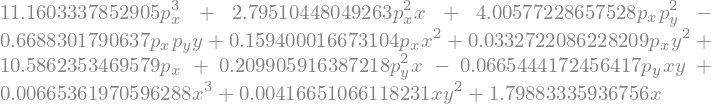

In [435]:
H4T[0]

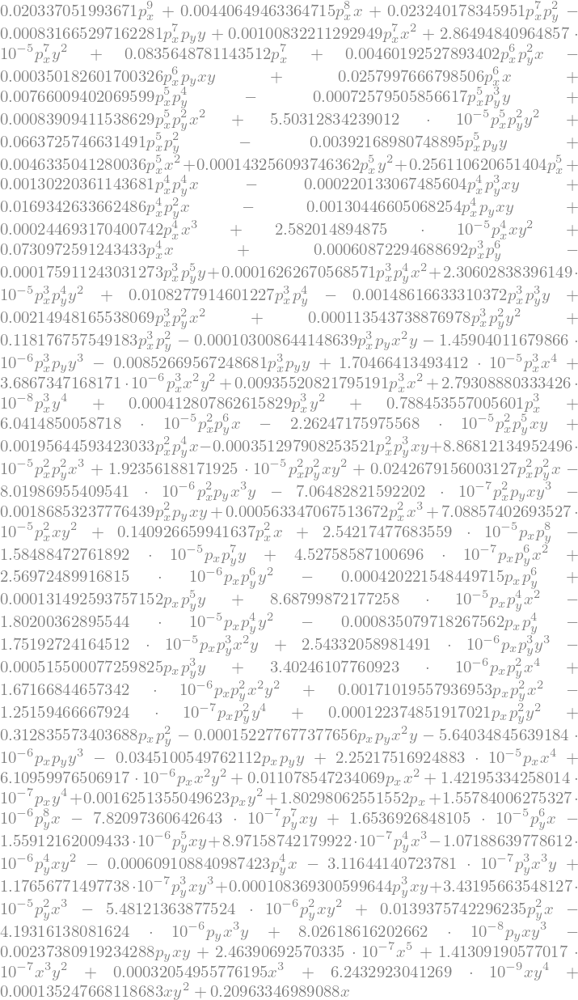

In [456]:
H4T[1]

In [356]:
H4.ham

In [467]:
_ld1 = float(LD.subs(rept))
_ld2 = float(LD.subs(rept))
_lqf = float(LQF.subs(rept))
_lqd = float(LQD.subs(rept))
_k1  = float(KQF.subs(rept))
_k2  = float(KQD.subs(rept))
dev  = 0
 
dpx = 0.05

R0 = GenerateNDimCoordinateGrid(6,2,man_ranges={
    0:[1.0000e-06, 1.0000e-04, 1.0000e-02, 1.0000e+00, 2.5000e-01,
       3.5000e-01, 4.5000e-01, 5.5000e-01, 6.5000e-01, 8.0000e-01,
       9.0000e-01, 1.0000e+00, 1.1000e+00, 1.2000e+00, 1.3000e+00,
       1.4000e+00, 1.5000e+00, 1.6000e+00, 1.7000e+00, 1.8000e+00,
       1.8500e+00, 1.9000e+00, 1.9500e+00, 2.0000e+00, 2.0125e+00,
       2.0250e+00, 2.0500e+00, 2.1000e+00, 2.2000e+00, 2.3000e+00
      ],
    1:[0,dpx],
    2:[0],
    3:[0],
    4:[0],
    5:[0]
})
r0 = R0.T.reshape(int(R0.size/6),6)

X_Exact = np.array([r0])
X_lin = np.array([r0])
X_Exact_2 = np.array([r0])
X_Exact_4 = np.array([r0])
# X_Exact_6 = np.array([r0])
# X_Exact_8 = np.array([r0])


for i in tqdm(range(1,46+1)):
    r_exact = FODO_Exact(X_Exact[-1])
    r_2 = track(X_Exact_2[-1],ef_x_2,ef_px_2,ef_y_2,ef_py_2)
    r_4 = track(X_Exact_4[-1],ef_x_4,ef_px_4,ef_y_4,ef_py_4)
#     r_6 = FODO_6(X_Exact_6[-1])
#     r_8 = FODO_8(X_Exact_8[-1])


    X_Exact = np.append(X_Exact, [r_exact], axis = 0)
    X_Exact_2 = np.append(X_Exact_2, [r_2], axis = 0)
    X_Exact_4 = np.append(X_Exact_4, [r_4], axis = 0)
#     X_Exact_6 = np.append(X_Exact_6, [r_6], axis = 0)
#     X_Exact_8 = np.append(X_Exact_8, [r_8], axis = 0)

100%|██████████| 46/46 [00:00<00:00, 254.38it/s]

Shape: (6, 2, 30, 1, 1, 1, 1) - Number of paritcles: 60 


<IPython.core.display.Javascript object>


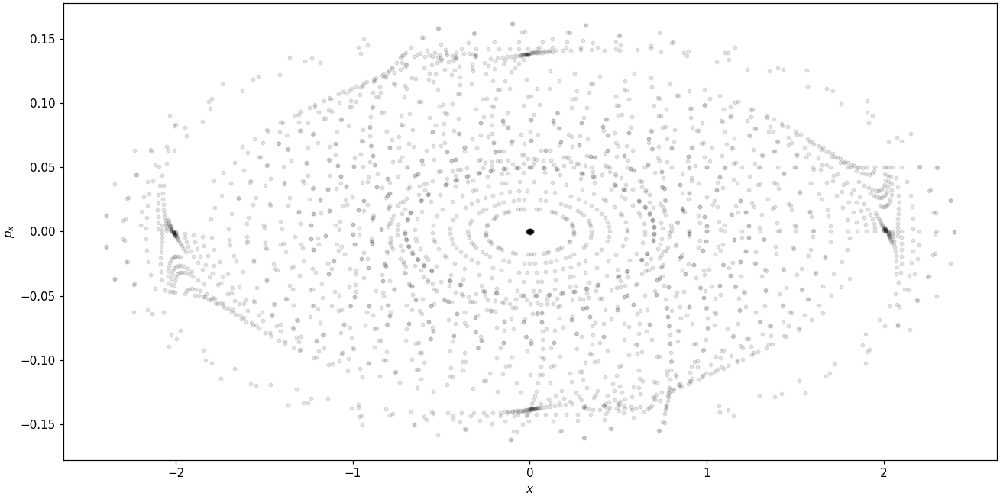

<IPython.core.display.Javascript object>


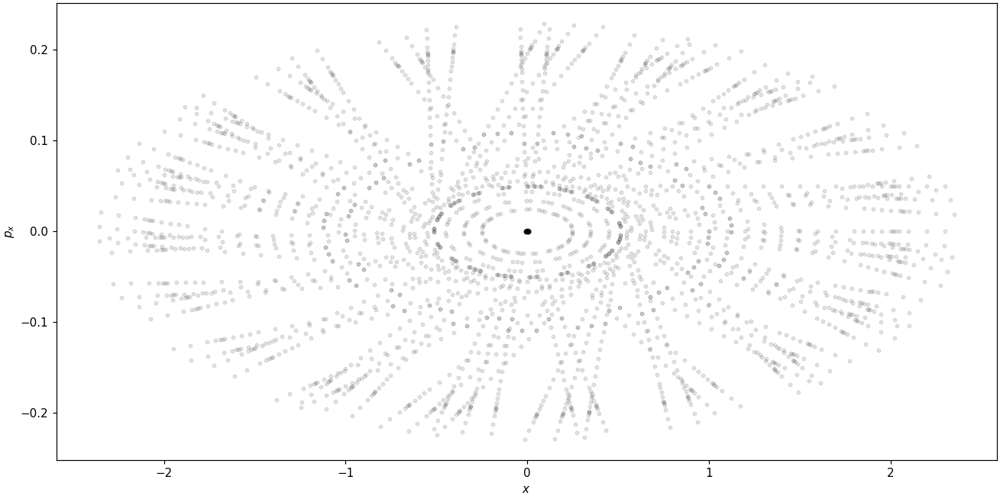

<IPython.core.display.Javascript object>


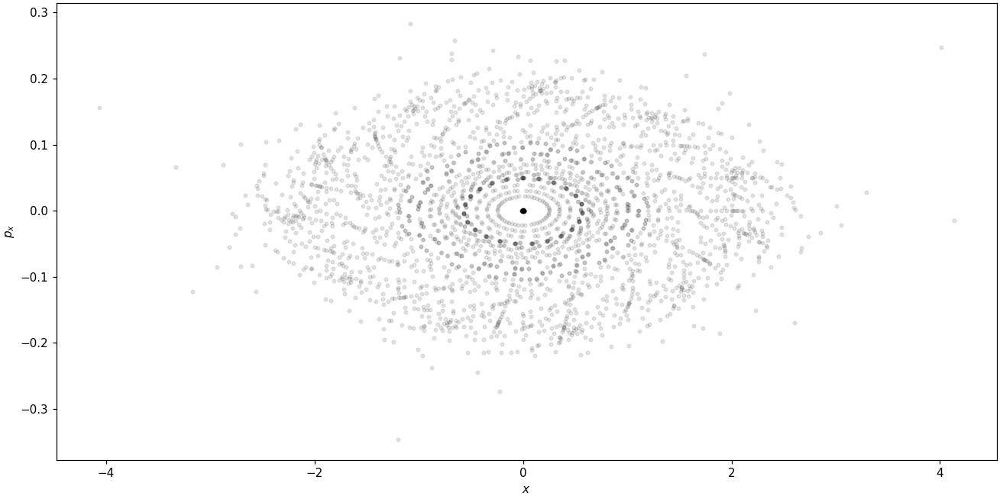

In [468]:
X_Exact_array = np.array(X_Exact)
# X_lin_array = np.array(X_lin)
X_Exact_2_array = np.array(X_Exact_2)
X_Exact_4_array = np.array(X_Exact_4)
# X_Exact_6_array = np.array(X_Exact_6)
# X_Exact_8_array = np.array(X_Exact_8)

d2 = False
New_FIG(X_Exact_array[:,:,0],X_Exact_array[:,:,1],X_Exact_array[:,:,2],X_Exact_array[:,:,3],d2=d2)
# New_FIG(X_lin_array[:,:,0],X_lin_array[:,:,1],X_lin_array[:,:,2],X_lin_array[:,:,3])
New_FIG(X_Exact_2_array[:,:,0],X_Exact_2_array[:,:,1],X_Exact_2_array[:,:,2],X_Exact_2_array[:,:,3],d2=d2)
New_FIG(X_Exact_4_array[:,:,0],X_Exact_4_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_4_array[:,:,3],d2=d2)
# New_FIG(X_Exact_6_array[:,:,0],X_Exact_6_array[:,:,1],X_Exact_4_array[:,:,2],X_Exact_6_array[:,:,3])
# New_FIG(X_Exact_8_array[:,:,0],X_Exact_8_array[:,:,1],X_Exact_6_array[:,:,2],X_Exact_8_array[:,:,3])


# plt.savefig('Drift_Exact.png')
plt.show()

In [321]:
HD_2 = AssignHam(*[eldict['drift'], 2, LD , Zero(), 0   ])
HD_4 = AssignHam(*[eldict['drift'], 4, LD , Zero(), 0   ])
HD_6 = AssignHam(*[eldict['drift'], 6, LD , Zero(), 0   ])
HD_8 = AssignHam(*[eldict['drift'], 8, LD , Zero(), 0   ])

drift_rep = (LD,1) # to use drift functions and use length as external parameter
L_drift_2 = LieOperator(sym_l * HD_2.subs(*drift_rep).subs(rept),[x,y],[px,py])
f_drift_2 = taylorize(L_drift_2,20)

L_drift_4 = LieOperator(sym_l * HD_4.subs(*drift_rep).subs(rept),[x,y],[px,py])
f_drift_4 = taylorize(L_drift_4,20)

L_drift_6 = LieOperator(sym_l * HD_6.subs(*drift_rep).subs(rept),[x,y],[px,py])
f_drift_6 = taylorize(L_drift_6,20)

L_drift_8 = LieOperator(sym_l * HD_8.subs(*drift_rep).subs(rept),[x,y],[px,py])
f_drift_8 = taylorize(L_drift_8,20)


100%|██████████| 2/2 [00:00<00:00,  3.43it/s]


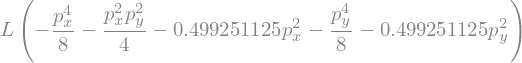

In [322]:
L_drift_4.ham